<a href="https://colab.research.google.com/github/frnocentini/brain-tumor-object-dectection/blob/main/ResNet101V22exp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd '/content/drive/MyDrive/dataset brain tumor/dataset'


/content/drive/MyDrive/dataset brain tumor/dataset


In [ ]:
!unzip 'axial_t1wce_2_class' -d '/dataset unzipped'

In [ ]:
!unzip 'coronal_t1wce_2_class' -d '/dataset unzipped'

In [ ]:
!unzip 'sagittal_t1wce_2_class' -d '/dataset unzipped'

In [6]:
# Data Manipulation
import numpy as np
import pandas as pd
import os
# Visualization/Image Processing
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
# Machine Learning
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, Flatten, MaxPool2D, Dense, Activation
from PIL import Image
# Other
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
import xml.etree.ElementTree as ET
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
import imutils

In [7]:
%cd '/dataset unzipped'

/dataset unzipped


In [13]:
def crop_brain_contour(image, plot=False):
    
    #brigthness addition
    brightness = 30
    image = np.int16(image)
    image = image + brightness
    image = np.clip(image,0,255)
    image = np.uint8(image)

    # Convert the image to grayscale, and blur it slightly
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image
    thresh = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY)[1]
    
    # Find contours in thresholded image, then grab the largest one
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    

    # Find the extreme points
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    # crop new image out of the original image using the four extreme points (left, right, top, bottom)
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    if plot:
        plt.figure()

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        
        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        
        plt.title('Original Image')
            
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)

        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)

        plt.title('Cropped Image')
        
        plt.show()
    
    return new_image,extLeft,extRight,extTop,extBot

In [14]:
#Hyperparameters 
image_size = 224
BATCH_SIZE = 16
hyper_channels = 3

In [15]:
#Bounding box with one tumor
#Define the name of the 3 classes of MRI
lab = ['axial_t1wce_2_class','coronal_t1wce_2_class', 'sagittal_t1wce_2_class']
#Define the list of images for the training 
X_train = []

count = 0;
#Lists of coordinates for resizing bounding box
temp_array  = []
extLeft_coords_x = []
extLeft_coords_y = []
extRight_coords_x = []
extRight_coords_y = []
extTop_coords_x = []
extTop_coords_y = []
extBot_coords_x = []
extBot_coords_y = []
image_width = []
image_height = []


extLeft_coords_x_test = []
extLeft_coords_y_test = []
extRight_coords_x_test = []
extRight_coords_y_test = []
extTop_coords_x_test = []
extTop_coords_y_test = []
extBot_coords_x_test = []
extBot_coords_y_test = []
images_width_test = []
images_height_test = []
width_new_im = []
height_new_im = []
traslazione_x_test = []
traslazione_y_test = []


#Loading training images
for i in lab:
    folderPath = os.path.join('./',i,'images','train')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        image_width.append(img.shape[1])
        image_height.append(img.shape[0])
        #crop the brain and ignore the unnecessary rest part of the image
        image,extLeft,extRight,extTop,extBot = crop_brain_contour(img,False)
        extLeft_coords_x.append(extLeft[0])
        extLeft_coords_y.append(extLeft[1])
        extRight_coords_x.append(extRight[0])
        extRight_coords_y.append(extRight[1])
        extTop_coords_x.append(extTop[0])
        extTop_coords_y.append(extTop[1])
        extBot_coords_x.append(extBot[0])
        extBot_coords_y.append(extBot[1])
        # resize image
        image = cv2.resize(image, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        X_train.append(image)

#Load train bounding box labels
image_index = 0
#Define the list of bb coordinates for the training images
bb_list = []
#List used to duplicate images with two bounding box
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','train')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                 
                temp_array[0] = temp_array[0]*image_width[count] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x[count]
                temp_array[0] = (temp_array[0]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                temp_array[1] = temp_array[1]*image_height[count]
                temp_array[1] = temp_array[1]-extTop_coords_y[count]
                temp_array[1] = (temp_array[1]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size
                
                temp_array[2] = temp_array[2]*(image_width[count])
                temp_array[2] = (temp_array[2]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                
                temp_array[3] = temp_array[3]*(image_height[count])
                temp_array[3] = (temp_array[3]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size                 
            
                lbls_array.append(temp_array)


            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count += 1

#Code to duplicate images with two bounding boxes
print('Dimension of the train list before image duplication:')
print('X_train: ', len(X_train))
print('bb_list: ', len(bb_list))

for i in range(len(X_train)):
  if(len(duplicate_img[i]) == 2):
    X_train.append(X_train[i])
    bb_list.append(duplicate_img[i][0])  #Inside bb_list the second label has already been put, now we insert the first label
bb_train = np.zeros((len(X_train),4))

for j in range(len(bb_list)):
  bb_train[j] = np.array([bb_list[j]])

#Dimension of the list after image duplication:
print('Dimension of the train list after image duplication:')
print('X_train: ', len(X_train))
print('bb_train: ', len(bb_train))


#Load test images
X_test = []
for i in lab:
    folderPath = os.path.join('./',i,'images','test')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        images_width_test.append(img.shape[1])
        images_height_test.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image_test,extLeft_test,extRight_test,extTop_test,extBot_test = crop_brain_contour(img,False)
        extLeft_coords_x_test.append(extLeft_test[0])
        extLeft_coords_y_test.append(extLeft_test[1])
        extRight_coords_x_test.append(extRight_test[0])
        extRight_coords_y_test.append(extRight_test[1])
        extTop_coords_x_test.append(extTop_test[0])
        extTop_coords_y_test.append(extTop_test[1])
        extBot_coords_x_test.append(extBot_test[0])
        extBot_coords_y_test.append(extBot_test[1])
        # resize image
        image_test = cv2.resize(image_test, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        X_test.append(image_test)

#Load the bounding box labels for testing
image_index = 0
count_test = 0;
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','test')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                
                #rescaling the bounding box to the correct position after crop
                temp_array[0] = temp_array[0]*images_width_test[count_test] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x_test[count_test]
                temp_array[0] = (temp_array[0]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                temp_array[1] = temp_array[1]*images_height_test[count_test]
                temp_array[1] = temp_array[1]-extTop_coords_y_test[count_test]
                temp_array[1] = (temp_array[1]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size
                
                temp_array[2] = temp_array[2]*(images_width_test[count_test])
                temp_array[2] = (temp_array[2]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                
                temp_array[3] = temp_array[3]*(images_height_test[count_test])
                temp_array[3] = (temp_array[3]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size                 
            
                lbls_array.append(temp_array)


            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count_test += 1

#Code to duplicate images with two bounding boxes
print('Dimension of the test list before image duplication:')
print('X_test: ', len(X_test))
print('bb_list: ', len(bb_list))

for i in range(len(X_test)):
  if(len(duplicate_img[i]) == 2):
    X_test.append(X_test[i])
    bb_list.append(duplicate_img[i][0]) #Inside bb_list the second label has already been put, now we insert the first label

bb_test = np.zeros((len(X_test),4))

for j in range(len(bb_test)):
  bb_test[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimension of the test list after image duplication:')
print('X_test: ', len(X_test))
print('bb_test: ', len(bb_test))


Dimension of the train list before image duplication:
X_train:  878
bb_list:  878
Dimension of the train list after image duplication:
X_train:  919
bb_train:  919
Dimension of the test list before image duplication:
X_test:  223
bb_list:  223
Dimension of the test list after image duplication:
X_test:  237
bb_test:  237


In [16]:
#prepare dataset 
train_dataset = ImageDataGenerator()
val_dataset = ImageDataGenerator()
test_dataset = ImageDataGenerator()

In [17]:
#array conversion
X_train = np.array(X_train)
X_test = np.array(X_test)

In [18]:
#Shuffle
X_train, bb_train = shuffle(X_train, bb_train)

In [19]:
#Validation set created
X_train, X_val, bb_train, bb_val = train_test_split(X_train, bb_train, test_size = 0.1, shuffle = False)

In [20]:
#Creation of the three data generator datasets to feed the model with batches of data during the training process
train_dataset = train_dataset.flow(X_train, bb_train, batch_size = BATCH_SIZE)
val_dataset = val_dataset.flow(X_val, bb_val, batch_size = BATCH_SIZE)
test_dataset = test_dataset.flow(X_test, bb_test, batch_size = BATCH_SIZE)

In [21]:
#Function to define the IoU metrics
def raw_iou(y_true, y_pred):
    results = []
    for i in range(0,y_true.shape[0]):

        #define the true and predicted coordinates (height and width)
        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        x_boxTrue_tleft = y_true[i,0]-boxTrue_width/2 
        y_boxTrue_tleft = y_true[i,1]-boxTrue_height/2

        #Define the bb true area 
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        x_boxPred_tleft = y_pred[i,0]-boxPred_width/2  
        y_boxPred_tleft = y_pred[i,1]-boxPred_height/2

        #Define the bb predicted area 
        area_boxPred = (boxPred_width * boxPred_height)


        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxIntersection - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxIntersection - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])
        
        #calculate the mean IoU for every image
        iou = np.mean(area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)).astype(np.float32)

        results.append(iou)
    return np.mean(results)

# metric creation
def IoU(y_true, y_pred):
    iou = tf.numpy_function(raw_iou, [y_true, y_pred], tf.float32)
    return iou



In [22]:
# Draw the predicted bounding boxes
def display_image(img, bbox_coords, pred_coords):
    if len(bbox_coords) == 4: #in red the real bounding box
        xmin, ymin, width, height = bbox_coords
        img = cv2.rectangle(img, (int(xmin-width/2), int(ymin-height/2)), (int(xmin+width/2), int(ymin+height/2)), (255, 0, 0), 1)
    if len(pred_coords) == 4: #in green the predicted bounding box
        xmin1, ymin1, width1, height1 = pred_coords
        img = cv2.rectangle(img, (int(xmin1-width1/2), int(ymin1-height1/2)), (int(xmin1+width1/2), int(ymin1+height1/2)), (0, 255, 0), 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

In [23]:
#To test the model during training
def test_model(model):
    rand_index = np.random.randint(0, bb_test.shape[0])
    pred_bbox = model.predict(X_test)[rand_index]
    img_original = X_test[rand_index]
    img = img_original.copy()
    coords = bb_test[rand_index]
    
    display_image(img,bbox_coords = coords, pred_coords=pred_bbox)

def test(model):
    
    plt.figure(figsize=(15,7))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        test_model(model)    
    plt.show()

class ShowTestImages(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test(self.model)
        

In [24]:
#change folder to create the folder for saving the model
%cd '../content/drive/MyDrive'
! mkdir  model_checkpoint_RESNET

/content/drive/MyDrive
mkdir: cannot create directory ‘model_checkpoint_RESNET’: File exists


In [25]:
save_path = './model_checkpoint_RESNET/model_RESNET.h5'

In [26]:
#list of callbacks
callbacks_list = [
    keras.callbacks.ModelCheckpoint(
    filepath=save_path,
    monitor="val_IoU",
    verbose=1,
    mode='max',
    save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
    monitor="val_IoU",
    patience=20,
    verbose=0,
    mode="max",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=50,
),

    ShowTestImages()
]

In [27]:
#Transfer Learning
resnet = ResNet101V2(weights='imagenet',include_top=False,input_shape=(image_size,image_size,hyper_channels))
#Fine tuning
model = resnet.output
model = tf.keras.layers.AveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Flatten()(model)
model = tf.keras.layers.Dense(4,name='bb_pred')(model)
model = tf.keras.models.Model(inputs=resnet.inputs, outputs = model)
model.summary()

171317808/171317808 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                           

In [29]:
#Compilation of the model
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

Epoch 1/100
52/52 [==============================] - ETA: 0s - loss: 28.1366 - IoU: 0.0999
Epoch 1: val_IoU improved from -inf to 0.00000, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 137ms/step


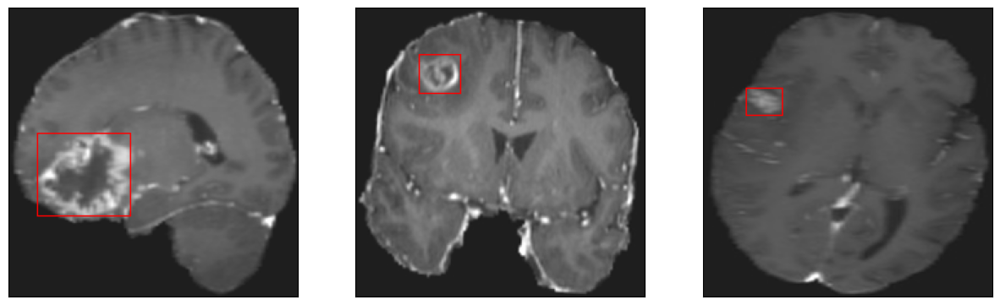

52/52 [==============================] - 119s 864ms/step - loss: 28.1366 - IoU: 0.0999 - val_loss: 324738.3438 - val_IoU: 0.0000e+00
Epoch 2/100
52/52 [==============================] - ETA: 0s - loss: 16.5761 - IoU: 0.2578
Epoch 2: val_IoU improved from 0.00000 to 0.09545, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 140ms/step


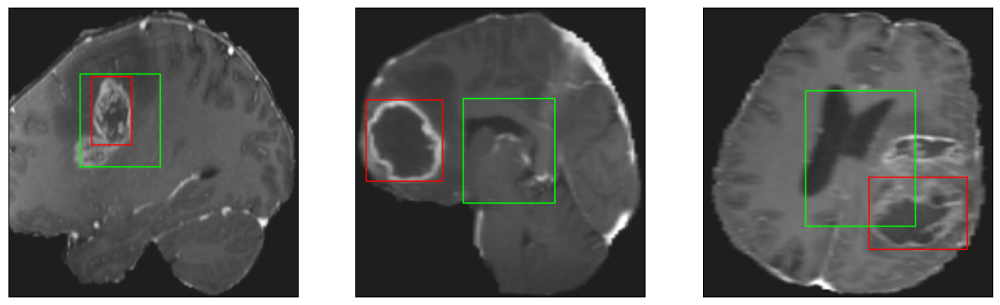

52/52 [==============================] - 32s 618ms/step - loss: 16.5761 - IoU: 0.2578 - val_loss: 42.0653 - val_IoU: 0.0955
Epoch 3/100
52/52 [==============================] - ETA: 0s - loss: 14.3013 - IoU: 0.3081
Epoch 3: val_IoU did not improve from 0.09545
8/8 [==============================] - 1s 144ms/step


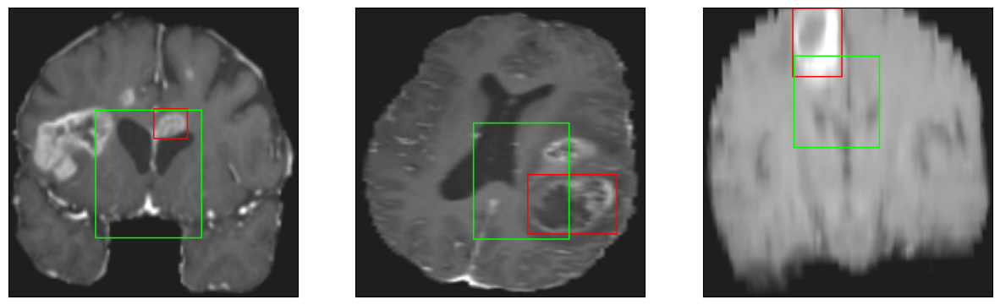

52/52 [==============================] - 20s 376ms/step - loss: 14.3013 - IoU: 0.3081 - val_loss: 42.1556 - val_IoU: 0.0818
Epoch 4/100
52/52 [==============================] - ETA: 0s - loss: 12.9882 - IoU: 0.3452
Epoch 4: val_IoU did not improve from 0.09545
8/8 [==============================] - 1s 148ms/step


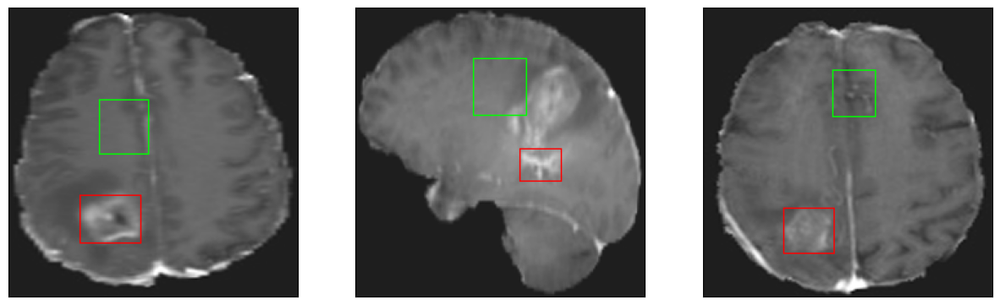

52/52 [==============================] - 20s 384ms/step - loss: 12.9882 - IoU: 0.3452 - val_loss: 28.2764 - val_IoU: 0.0679
Epoch 5/100
52/52 [==============================] - ETA: 0s - loss: 11.7337 - IoU: 0.3790
Epoch 5: val_IoU improved from 0.09545 to 0.20719, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 148ms/step


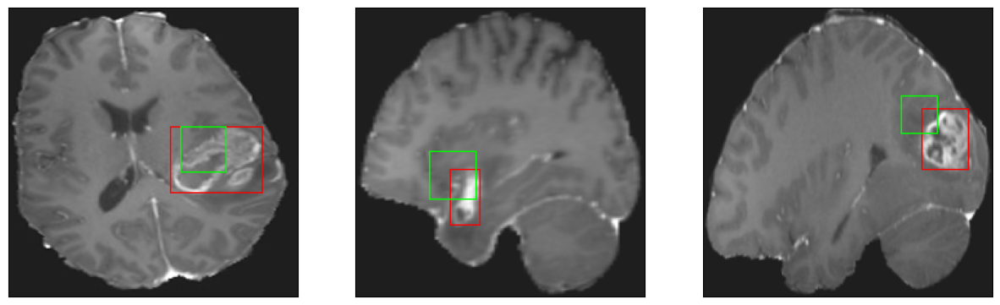

52/52 [==============================] - 36s 709ms/step - loss: 11.7337 - IoU: 0.3790 - val_loss: 19.5089 - val_IoU: 0.2072
Epoch 6/100
52/52 [==============================] - ETA: 0s - loss: 10.6263 - IoU: 0.4113
Epoch 6: val_IoU improved from 0.20719 to 0.30314, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 148ms/step


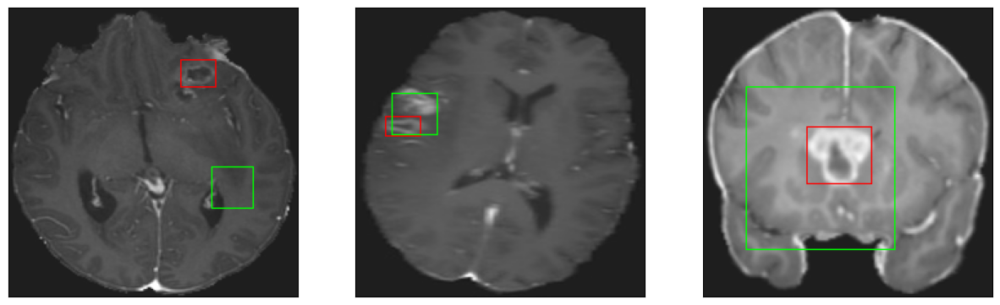

52/52 [==============================] - 32s 626ms/step - loss: 10.6263 - IoU: 0.4113 - val_loss: 20.3657 - val_IoU: 0.3031
Epoch 7/100
52/52 [==============================] - ETA: 0s - loss: 10.2504 - IoU: 0.4367
Epoch 7: val_IoU did not improve from 0.30314
8/8 [==============================] - 1s 153ms/step


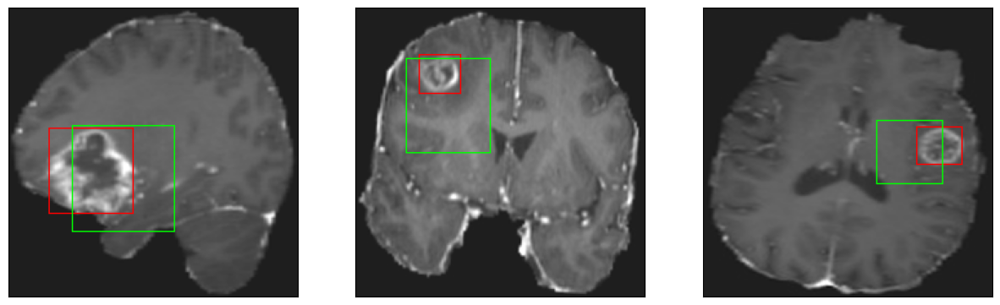

52/52 [==============================] - 20s 390ms/step - loss: 10.2504 - IoU: 0.4367 - val_loss: 22.7981 - val_IoU: 0.2621
Epoch 8/100
52/52 [==============================] - ETA: 0s - loss: 9.1973 - IoU: 0.4651
Epoch 8: val_IoU did not improve from 0.30314
8/8 [==============================] - 1s 149ms/step


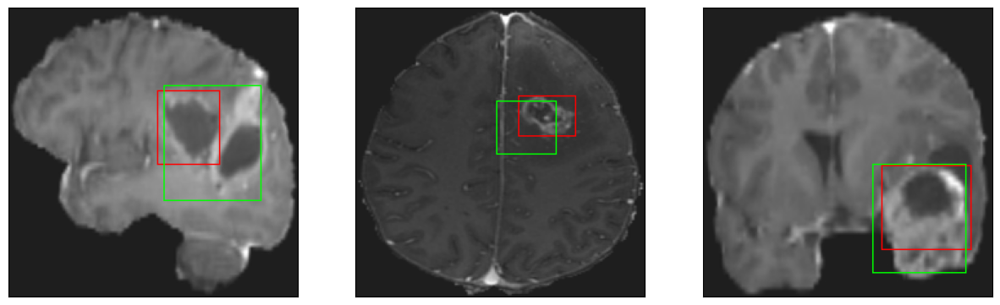

52/52 [==============================] - 20s 380ms/step - loss: 9.1973 - IoU: 0.4651 - val_loss: 17.9219 - val_IoU: 0.2913
Epoch 9/100
52/52 [==============================] - ETA: 0s - loss: 9.1646 - IoU: 0.4779
Epoch 9: val_IoU improved from 0.30314 to 0.35698, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


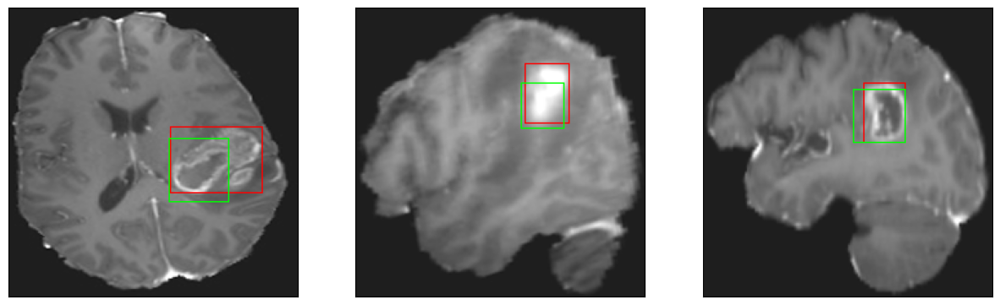

52/52 [==============================] - 33s 636ms/step - loss: 9.1646 - IoU: 0.4779 - val_loss: 12.0299 - val_IoU: 0.3570
Epoch 10/100
52/52 [==============================] - ETA: 0s - loss: 9.2171 - IoU: 0.4651
Epoch 10: val_IoU did not improve from 0.35698
8/8 [==============================] - 1s 150ms/step


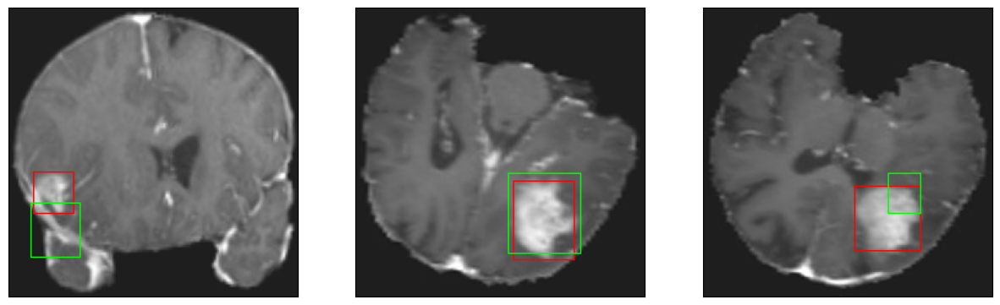

52/52 [==============================] - 20s 386ms/step - loss: 9.2171 - IoU: 0.4651 - val_loss: 12.8540 - val_IoU: 0.3296
Epoch 11/100
52/52 [==============================] - ETA: 0s - loss: 8.1385 - IoU: 0.5095
Epoch 11: val_IoU did not improve from 0.35698
8/8 [==============================] - 1s 154ms/step


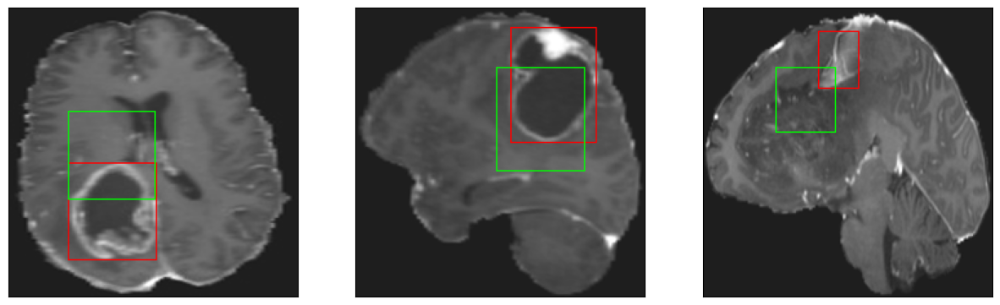

52/52 [==============================] - 20s 392ms/step - loss: 8.1385 - IoU: 0.5095 - val_loss: 33.0746 - val_IoU: 0.2227
Epoch 12/100
52/52 [==============================] - ETA: 0s - loss: 7.9521 - IoU: 0.5114
Epoch 12: val_IoU improved from 0.35698 to 0.37841, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


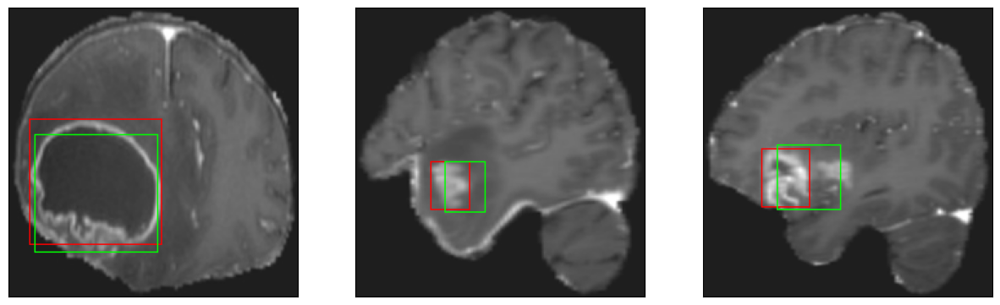

52/52 [==============================] - 33s 636ms/step - loss: 7.9521 - IoU: 0.5114 - val_loss: 13.4942 - val_IoU: 0.3784
Epoch 13/100
52/52 [==============================] - ETA: 0s - loss: 7.9883 - IoU: 0.5094
Epoch 13: val_IoU improved from 0.37841 to 0.53496, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 150ms/step


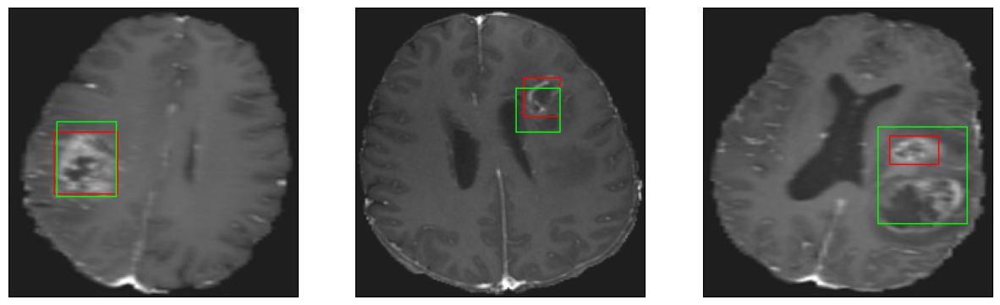

52/52 [==============================] - 36s 700ms/step - loss: 7.9883 - IoU: 0.5094 - val_loss: 8.3255 - val_IoU: 0.5350
Epoch 14/100
52/52 [==============================] - ETA: 0s - loss: 7.5950 - IoU: 0.5234
Epoch 14: val_IoU did not improve from 0.53496
8/8 [==============================] - 1s 154ms/step


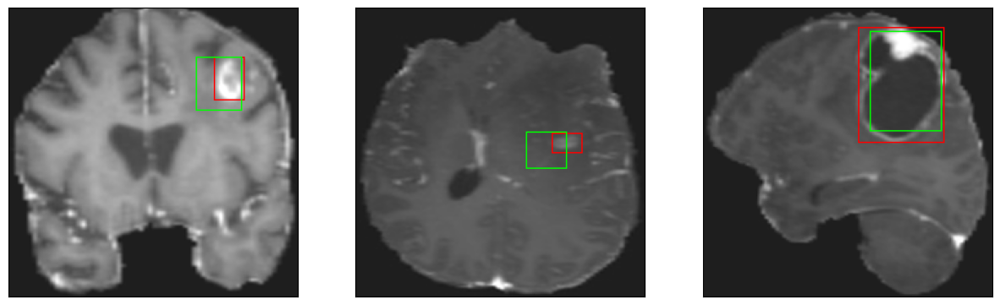

52/52 [==============================] - 20s 395ms/step - loss: 7.5950 - IoU: 0.5234 - val_loss: 9.0844 - val_IoU: 0.4889
Epoch 15/100
52/52 [==============================] - ETA: 0s - loss: 7.2277 - IoU: 0.5389
Epoch 15: val_IoU did not improve from 0.53496
8/8 [==============================] - 1s 150ms/step


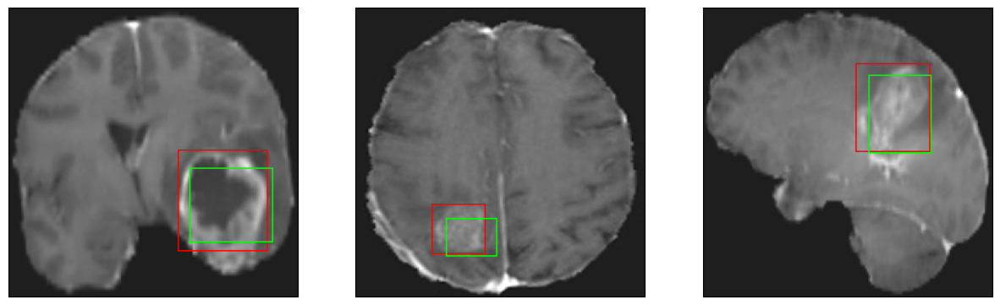

52/52 [==============================] - 20s 392ms/step - loss: 7.2277 - IoU: 0.5389 - val_loss: 9.0011 - val_IoU: 0.4880
Epoch 16/100
52/52 [==============================] - ETA: 0s - loss: 7.7010 - IoU: 0.5245
Epoch 16: val_IoU did not improve from 0.53496
8/8 [==============================] - 1s 147ms/step


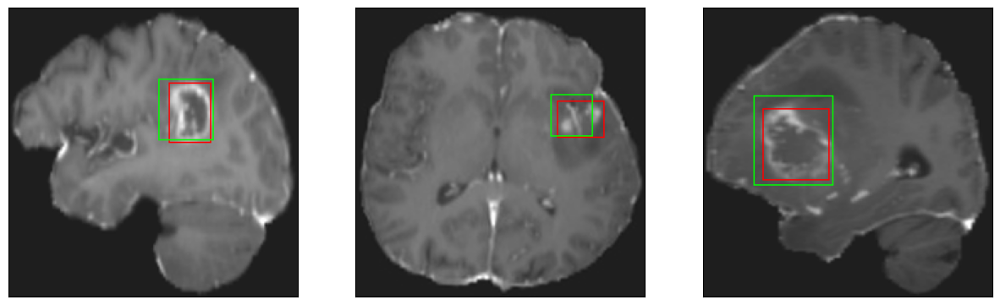

52/52 [==============================] - 20s 382ms/step - loss: 7.7010 - IoU: 0.5245 - val_loss: 11.4573 - val_IoU: 0.5022
Epoch 17/100
52/52 [==============================] - ETA: 0s - loss: 6.9133 - IoU: 0.5478
Epoch 17: val_IoU improved from 0.53496 to 0.57727, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 147ms/step


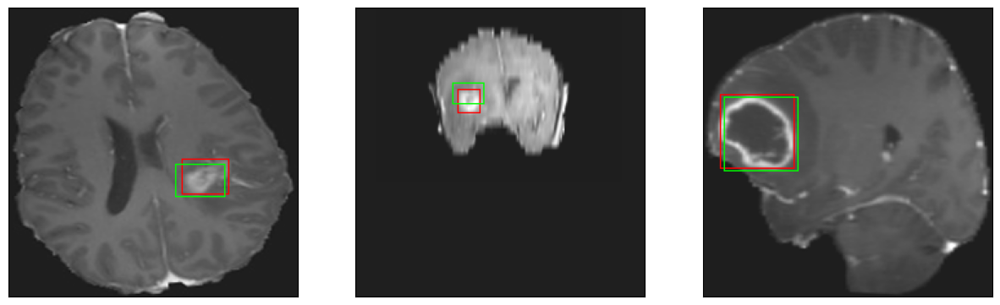

52/52 [==============================] - 32s 624ms/step - loss: 6.9133 - IoU: 0.5478 - val_loss: 7.3062 - val_IoU: 0.5773
Epoch 18/100
52/52 [==============================] - ETA: 0s - loss: 7.3096 - IoU: 0.5303
Epoch 18: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 154ms/step


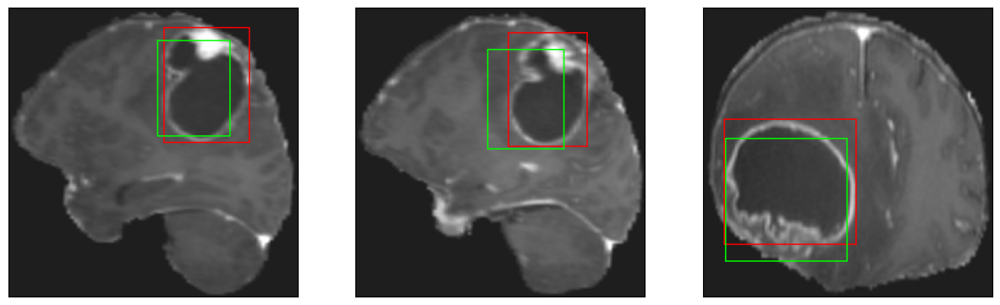

52/52 [==============================] - 20s 391ms/step - loss: 7.3096 - IoU: 0.5303 - val_loss: 6.8634 - val_IoU: 0.5617
Epoch 19/100
52/52 [==============================] - ETA: 0s - loss: 6.6282 - IoU: 0.5589
Epoch 19: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 151ms/step


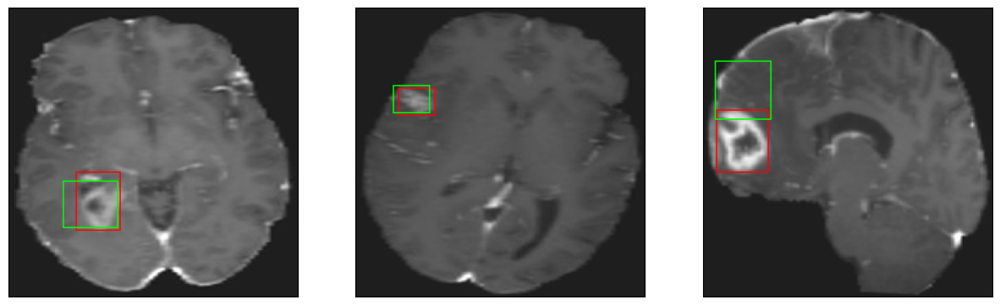

52/52 [==============================] - 20s 388ms/step - loss: 6.6282 - IoU: 0.5589 - val_loss: 8.2845 - val_IoU: 0.5314
Epoch 20/100
52/52 [==============================] - ETA: 0s - loss: 6.7917 - IoU: 0.5567
Epoch 20: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 147ms/step


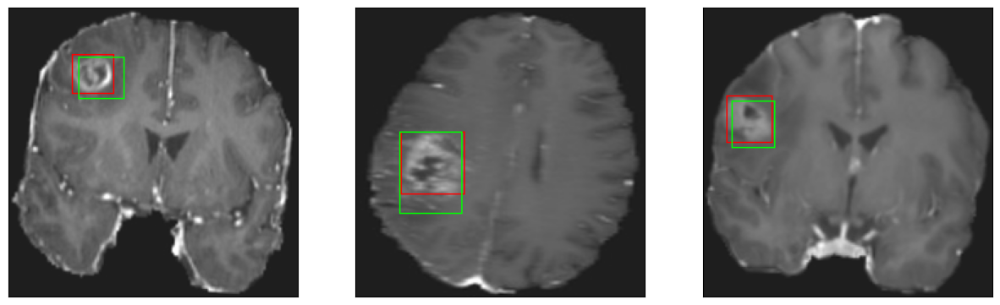

52/52 [==============================] - 21s 398ms/step - loss: 6.7917 - IoU: 0.5567 - val_loss: 8.5809 - val_IoU: 0.5414
Epoch 21/100
52/52 [==============================] - ETA: 0s - loss: 6.6935 - IoU: 0.5535
Epoch 21: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 145ms/step


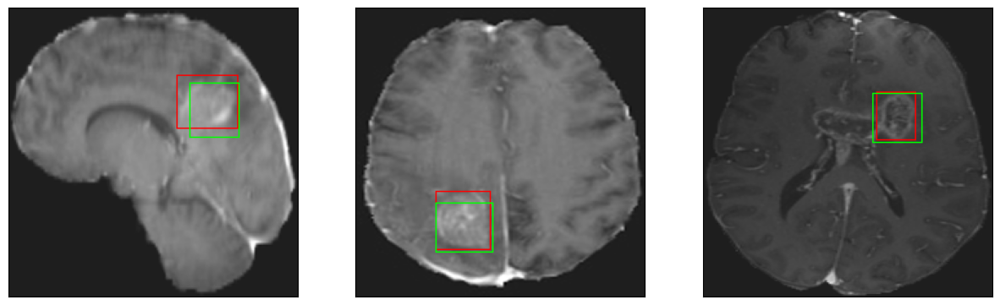

52/52 [==============================] - 20s 386ms/step - loss: 6.6935 - IoU: 0.5535 - val_loss: 7.9105 - val_IoU: 0.5564
Epoch 22/100
52/52 [==============================] - ETA: 0s - loss: 6.7478 - IoU: 0.5552
Epoch 22: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 149ms/step


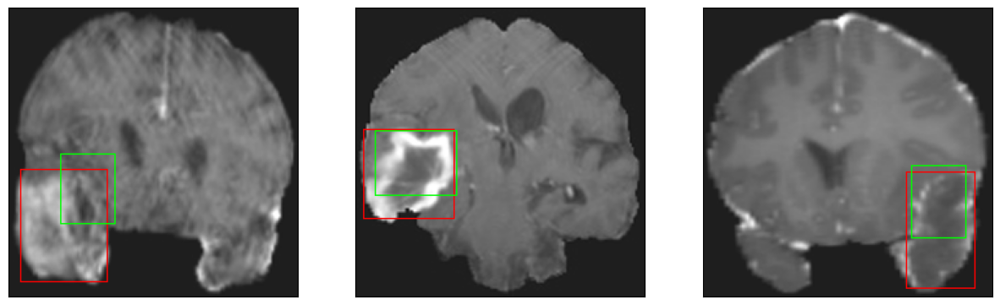

52/52 [==============================] - 20s 389ms/step - loss: 6.7478 - IoU: 0.5552 - val_loss: 7.3978 - val_IoU: 0.5602
Epoch 23/100
52/52 [==============================] - ETA: 0s - loss: 6.2668 - IoU: 0.5758
Epoch 23: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 148ms/step


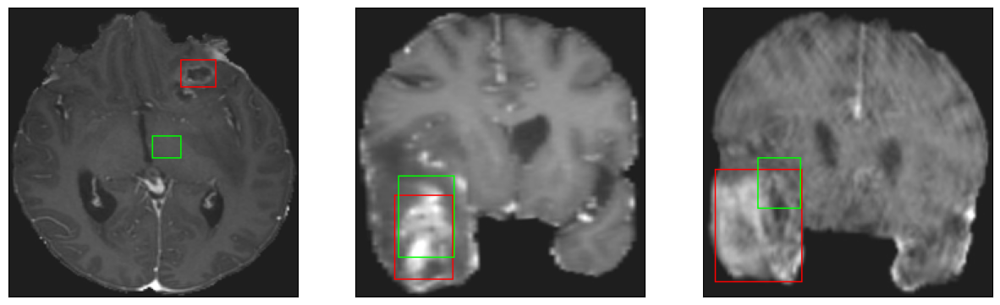

52/52 [==============================] - 20s 385ms/step - loss: 6.2668 - IoU: 0.5758 - val_loss: 8.6249 - val_IoU: 0.5311
Epoch 24/100
52/52 [==============================] - ETA: 0s - loss: 6.3311 - IoU: 0.5783
Epoch 24: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 153ms/step


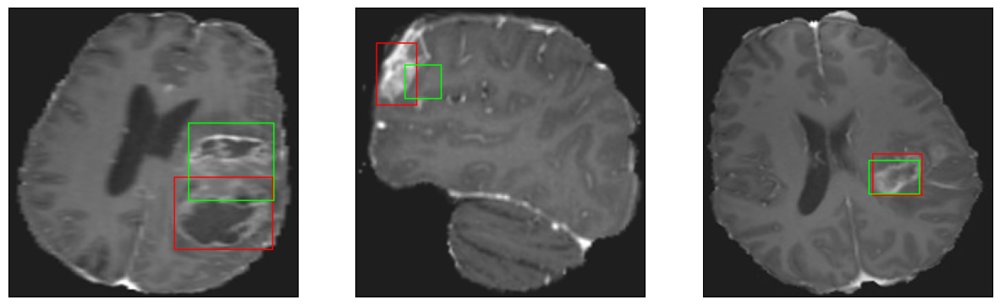

52/52 [==============================] - 20s 393ms/step - loss: 6.3311 - IoU: 0.5783 - val_loss: 7.3996 - val_IoU: 0.5529
Epoch 25/100
52/52 [==============================] - ETA: 0s - loss: 6.3420 - IoU: 0.5734
Epoch 25: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 150ms/step


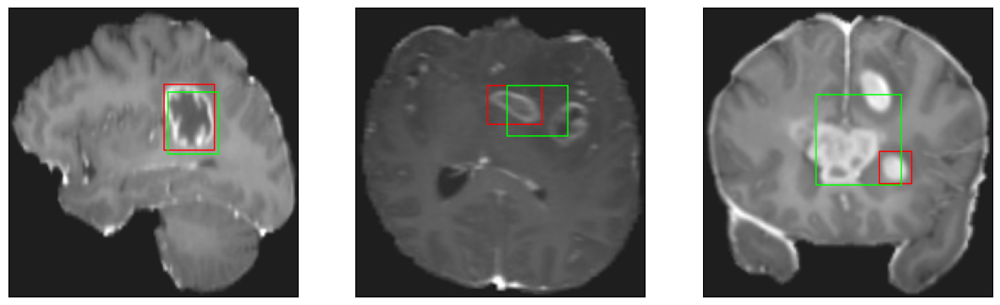

52/52 [==============================] - 20s 385ms/step - loss: 6.3420 - IoU: 0.5734 - val_loss: 7.8353 - val_IoU: 0.5437
Epoch 26/100
52/52 [==============================] - ETA: 0s - loss: 6.1346 - IoU: 0.5828
Epoch 26: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 150ms/step


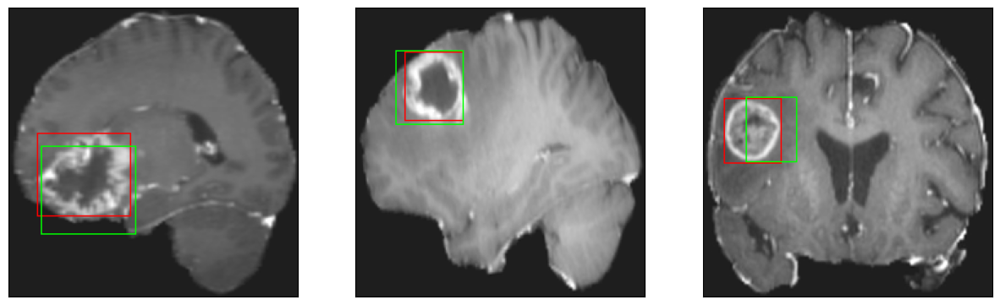

52/52 [==============================] - 20s 386ms/step - loss: 6.1346 - IoU: 0.5828 - val_loss: 8.2214 - val_IoU: 0.5339
Epoch 27/100
52/52 [==============================] - ETA: 0s - loss: 6.1150 - IoU: 0.5802
Epoch 27: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 148ms/step


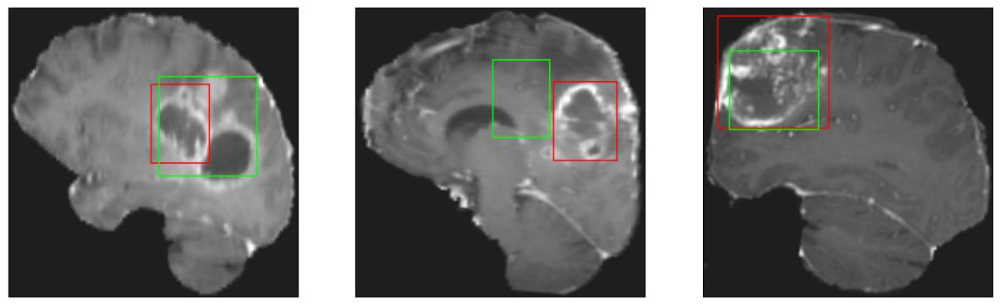

52/52 [==============================] - 20s 387ms/step - loss: 6.1150 - IoU: 0.5802 - val_loss: 8.4089 - val_IoU: 0.5208
Epoch 28/100
52/52 [==============================] - ETA: 0s - loss: 5.9909 - IoU: 0.5912
Epoch 28: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 150ms/step


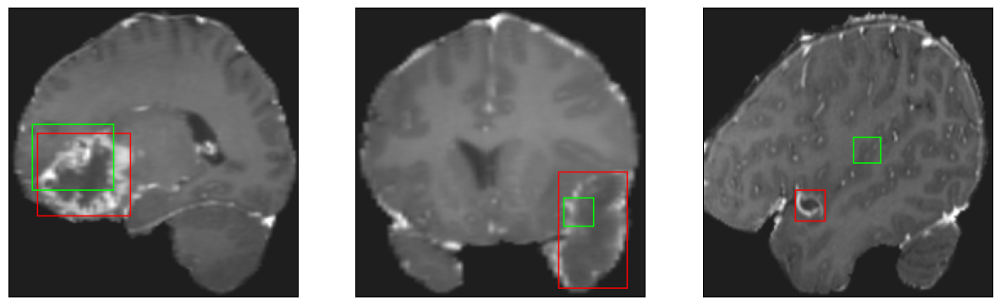

52/52 [==============================] - 20s 388ms/step - loss: 5.9909 - IoU: 0.5912 - val_loss: 10.3057 - val_IoU: 0.4042
Epoch 29/100
52/52 [==============================] - ETA: 0s - loss: 5.8212 - IoU: 0.5998
Epoch 29: val_IoU did not improve from 0.57727
8/8 [==============================] - 1s 146ms/step


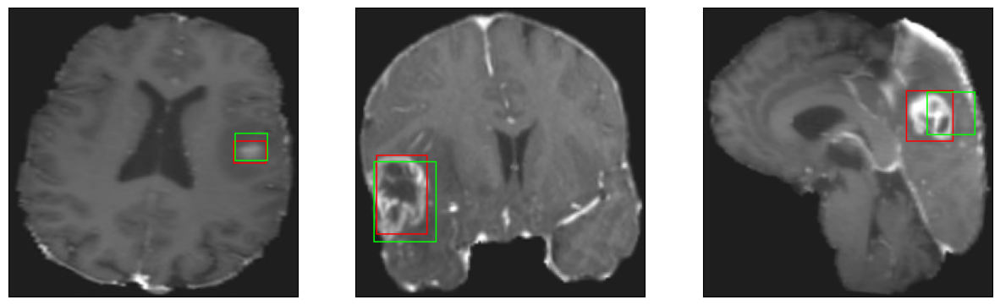

52/52 [==============================] - 20s 387ms/step - loss: 5.8212 - IoU: 0.5998 - val_loss: 8.2861 - val_IoU: 0.5131
Epoch 30/100
52/52 [==============================] - ETA: 0s - loss: 5.8801 - IoU: 0.5919
Epoch 30: val_IoU improved from 0.57727 to 0.61023, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 145ms/step


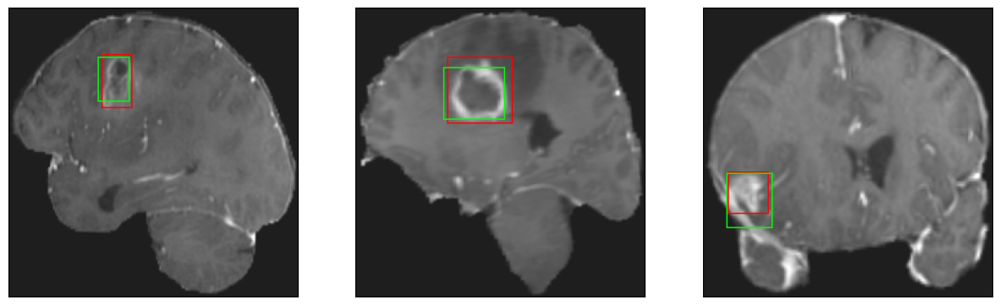

52/52 [==============================] - 39s 753ms/step - loss: 5.8801 - IoU: 0.5919 - val_loss: 6.9428 - val_IoU: 0.6102
Epoch 31/100
52/52 [==============================] - ETA: 0s - loss: 5.5487 - IoU: 0.6053
Epoch 31: val_IoU did not improve from 0.61023
8/8 [==============================] - 1s 150ms/step


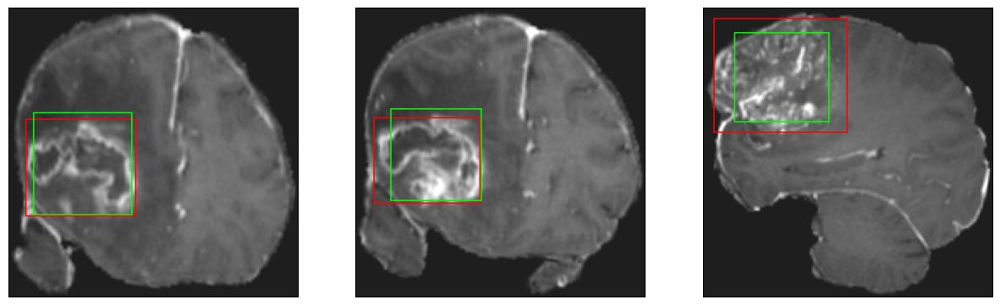

52/52 [==============================] - 20s 392ms/step - loss: 5.5487 - IoU: 0.6053 - val_loss: 7.6220 - val_IoU: 0.5434
Epoch 32/100
52/52 [==============================] - ETA: 0s - loss: 5.6203 - IoU: 0.5983
Epoch 32: val_IoU improved from 0.61023 to 0.61663, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


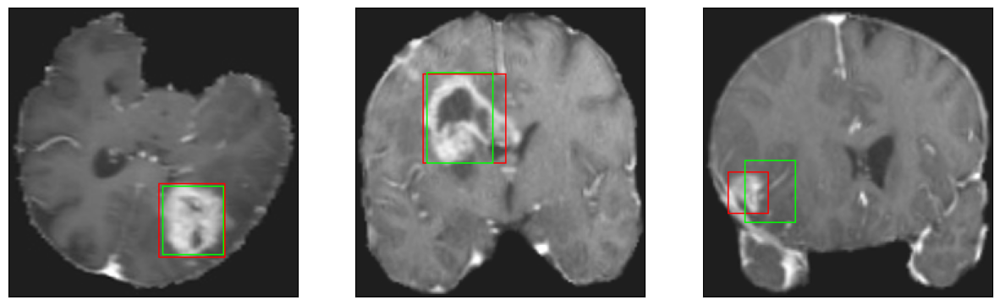

52/52 [==============================] - 34s 663ms/step - loss: 5.6203 - IoU: 0.5983 - val_loss: 7.1801 - val_IoU: 0.6166
Epoch 33/100
52/52 [==============================] - ETA: 0s - loss: 5.5435 - IoU: 0.6100
Epoch 33: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 152ms/step


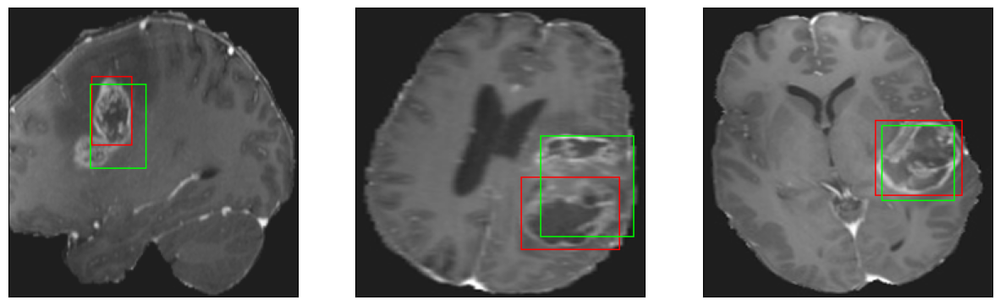

52/52 [==============================] - 20s 393ms/step - loss: 5.5435 - IoU: 0.6100 - val_loss: 7.5867 - val_IoU: 0.5608
Epoch 34/100
52/52 [==============================] - ETA: 0s - loss: 5.5895 - IoU: 0.6076
Epoch 34: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 149ms/step


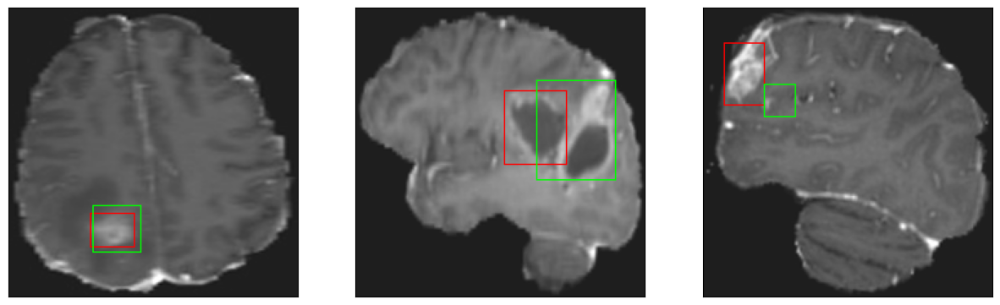

52/52 [==============================] - 20s 389ms/step - loss: 5.5895 - IoU: 0.6076 - val_loss: 8.7524 - val_IoU: 0.5445
Epoch 35/100
52/52 [==============================] - ETA: 0s - loss: 5.6595 - IoU: 0.6007
Epoch 35: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 153ms/step


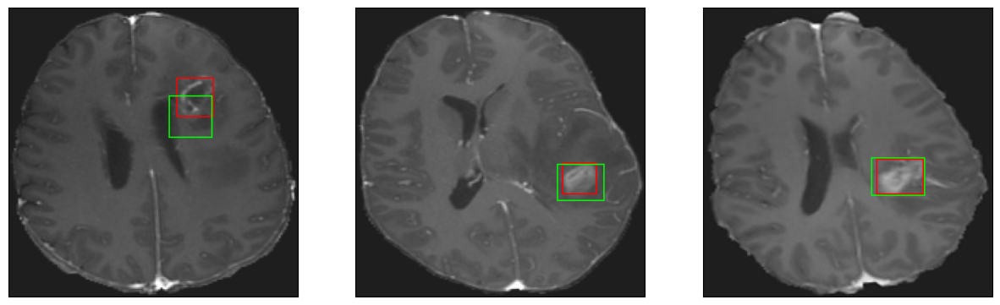

52/52 [==============================] - 20s 395ms/step - loss: 5.6595 - IoU: 0.6007 - val_loss: 9.8450 - val_IoU: 0.5106
Epoch 36/100
52/52 [==============================] - ETA: 0s - loss: 5.8603 - IoU: 0.5889
Epoch 36: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 147ms/step


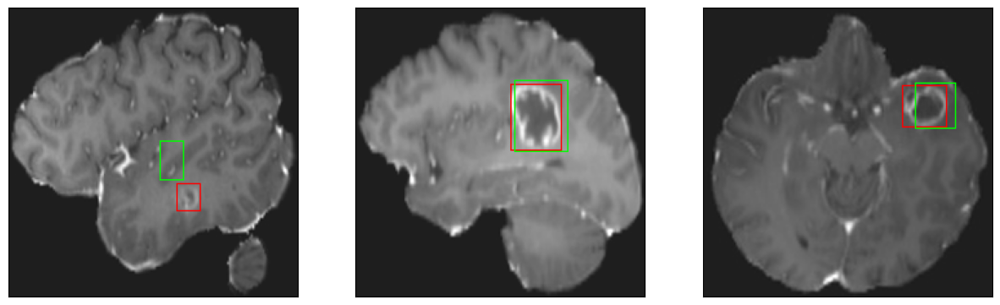

52/52 [==============================] - 20s 386ms/step - loss: 5.8603 - IoU: 0.5889 - val_loss: 8.0227 - val_IoU: 0.5667
Epoch 37/100
52/52 [==============================] - ETA: 0s - loss: 5.5031 - IoU: 0.6145
Epoch 37: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 148ms/step


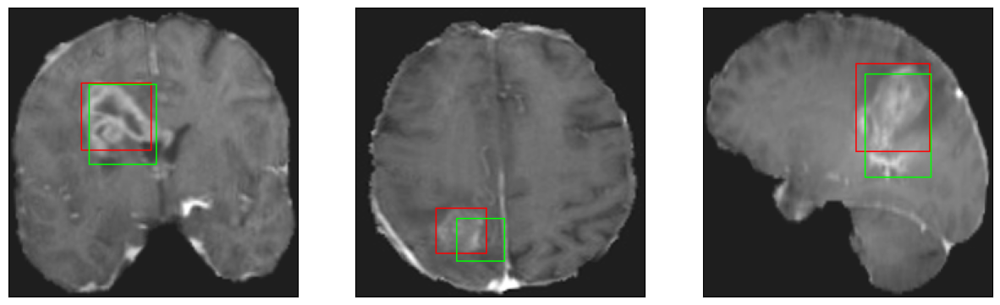

52/52 [==============================] - 20s 394ms/step - loss: 5.5031 - IoU: 0.6145 - val_loss: 7.2602 - val_IoU: 0.5737
Epoch 38/100
52/52 [==============================] - ETA: 0s - loss: 5.2971 - IoU: 0.6174
Epoch 38: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 148ms/step


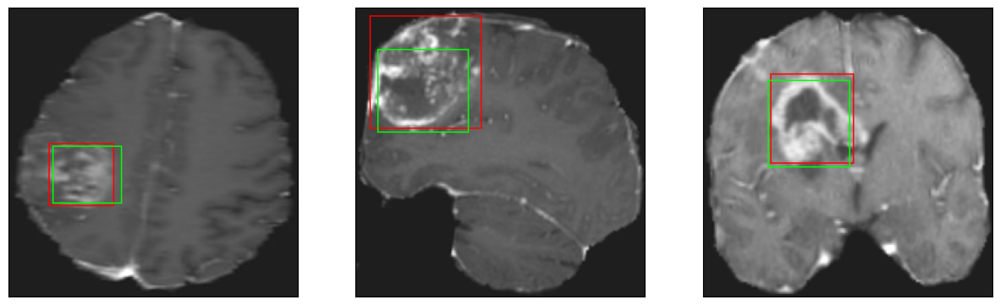

52/52 [==============================] - 20s 390ms/step - loss: 5.2971 - IoU: 0.6174 - val_loss: 8.1003 - val_IoU: 0.5499
Epoch 39/100
52/52 [==============================] - ETA: 0s - loss: 5.3377 - IoU: 0.6181
Epoch 39: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 151ms/step


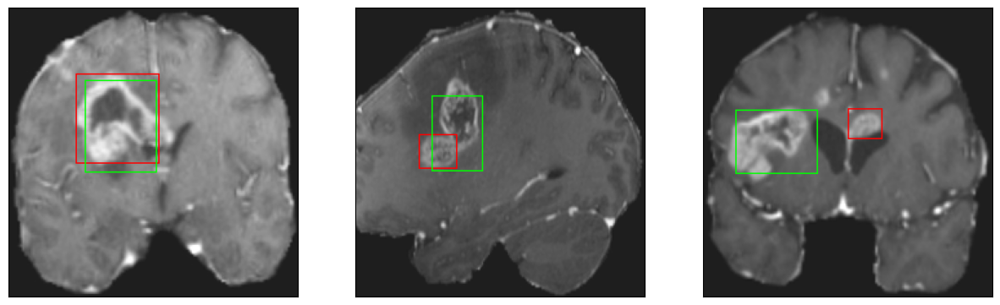

52/52 [==============================] - 21s 396ms/step - loss: 5.3377 - IoU: 0.6181 - val_loss: 7.5382 - val_IoU: 0.5752
Epoch 40/100
52/52 [==============================] - ETA: 0s - loss: 5.3115 - IoU: 0.6245
Epoch 40: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 152ms/step


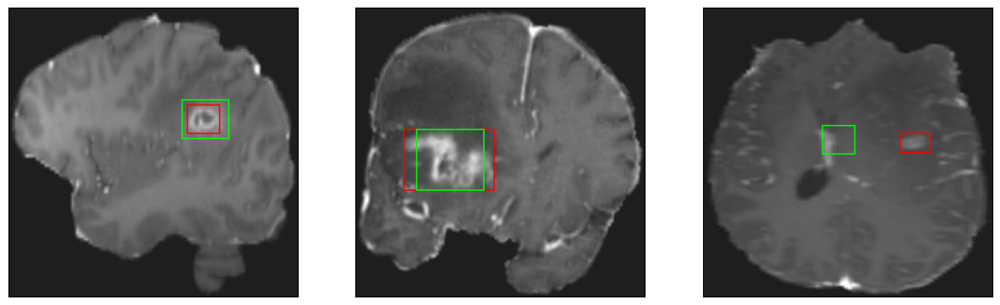

52/52 [==============================] - 20s 389ms/step - loss: 5.3115 - IoU: 0.6245 - val_loss: 6.6618 - val_IoU: 0.6071
Epoch 41/100
52/52 [==============================] - ETA: 0s - loss: 5.4748 - IoU: 0.6088
Epoch 41: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 154ms/step


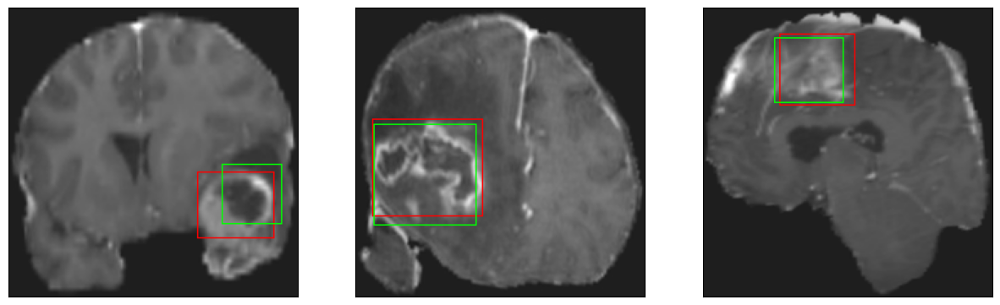

52/52 [==============================] - 20s 395ms/step - loss: 5.4748 - IoU: 0.6088 - val_loss: 7.6135 - val_IoU: 0.5807
Epoch 42/100
52/52 [==============================] - ETA: 0s - loss: 5.1050 - IoU: 0.6377
Epoch 42: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 151ms/step


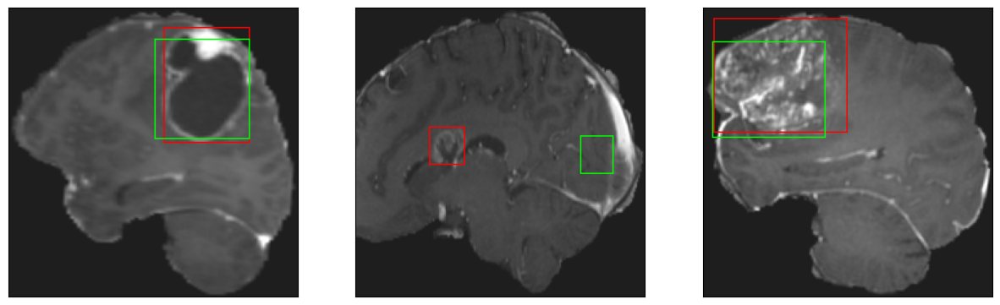

52/52 [==============================] - 21s 397ms/step - loss: 5.1050 - IoU: 0.6377 - val_loss: 7.7293 - val_IoU: 0.5781
Epoch 43/100
52/52 [==============================] - ETA: 0s - loss: 5.1489 - IoU: 0.6254
Epoch 43: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 146ms/step


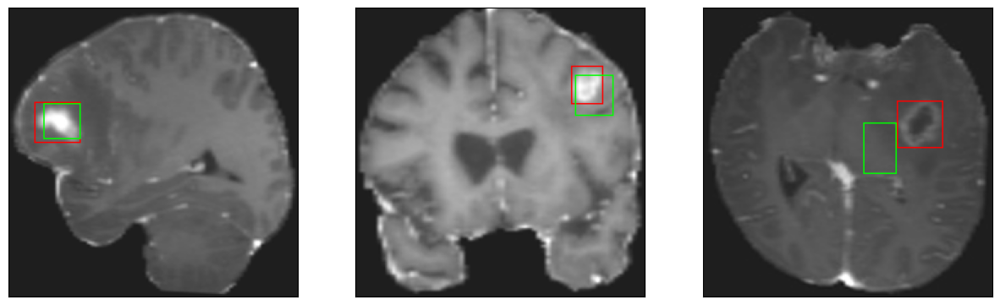

52/52 [==============================] - 20s 393ms/step - loss: 5.1489 - IoU: 0.6254 - val_loss: 7.0770 - val_IoU: 0.5987
Epoch 44/100
52/52 [==============================] - ETA: 0s - loss: 5.0826 - IoU: 0.6271
Epoch 44: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 148ms/step


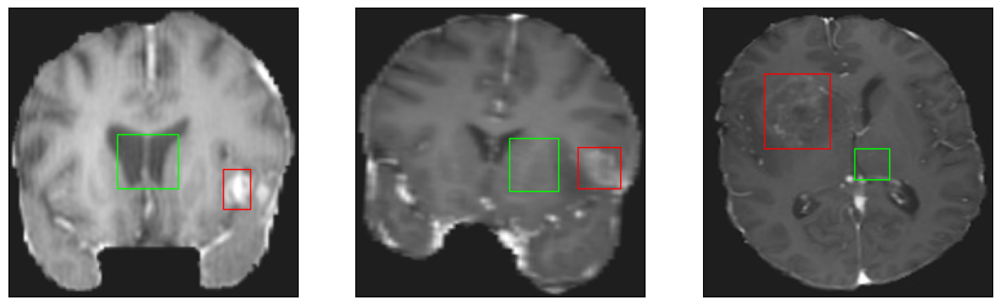

52/52 [==============================] - 20s 388ms/step - loss: 5.0826 - IoU: 0.6271 - val_loss: 7.7648 - val_IoU: 0.5565
Epoch 45/100
52/52 [==============================] - ETA: 0s - loss: 5.1741 - IoU: 0.6246
Epoch 45: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 150ms/step


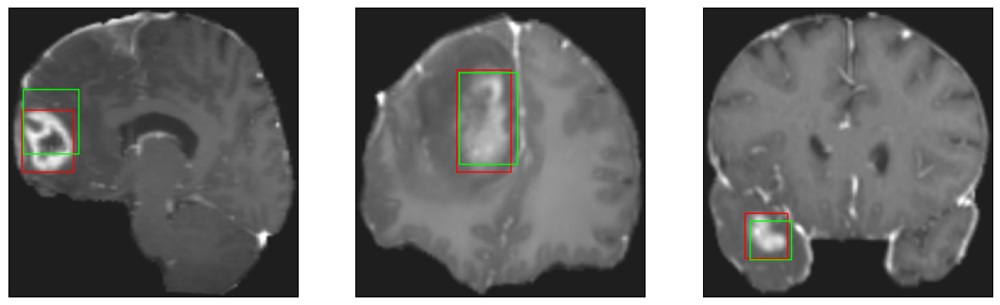

52/52 [==============================] - 20s 395ms/step - loss: 5.1741 - IoU: 0.6246 - val_loss: 7.5096 - val_IoU: 0.5993
Epoch 46/100
52/52 [==============================] - ETA: 0s - loss: 5.3925 - IoU: 0.6036
Epoch 46: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 148ms/step


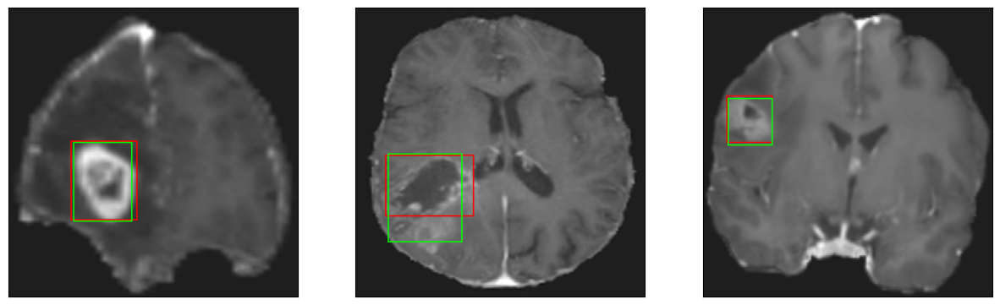

52/52 [==============================] - 20s 390ms/step - loss: 5.3925 - IoU: 0.6036 - val_loss: 8.4420 - val_IoU: 0.5496
Epoch 47/100
52/52 [==============================] - ETA: 0s - loss: 4.9899 - IoU: 0.6376
Epoch 47: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 149ms/step


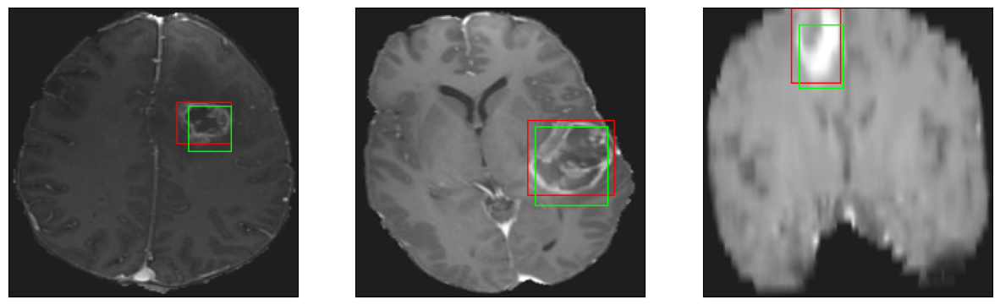

52/52 [==============================] - 20s 396ms/step - loss: 4.9899 - IoU: 0.6376 - val_loss: 8.1017 - val_IoU: 0.5415
Epoch 48/100
52/52 [==============================] - ETA: 0s - loss: 5.0320 - IoU: 0.6290
Epoch 48: val_IoU did not improve from 0.61663
8/8 [==============================] - 1s 148ms/step


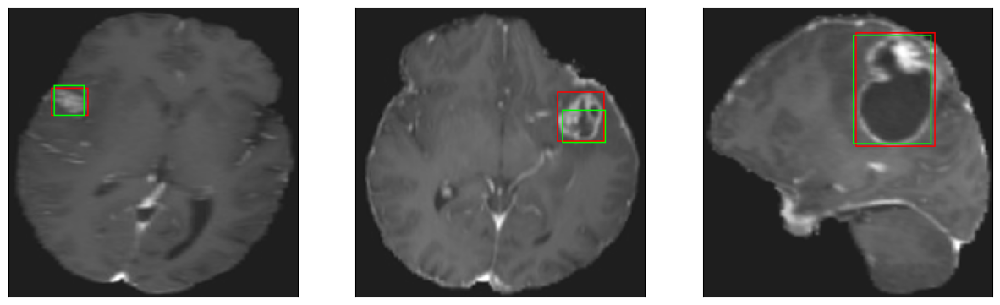

52/52 [==============================] - 20s 389ms/step - loss: 5.0320 - IoU: 0.6290 - val_loss: 7.1904 - val_IoU: 0.5952
Epoch 49/100
52/52 [==============================] - ETA: 0s - loss: 5.0860 - IoU: 0.6273
Epoch 49: val_IoU improved from 0.61663 to 0.63910, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


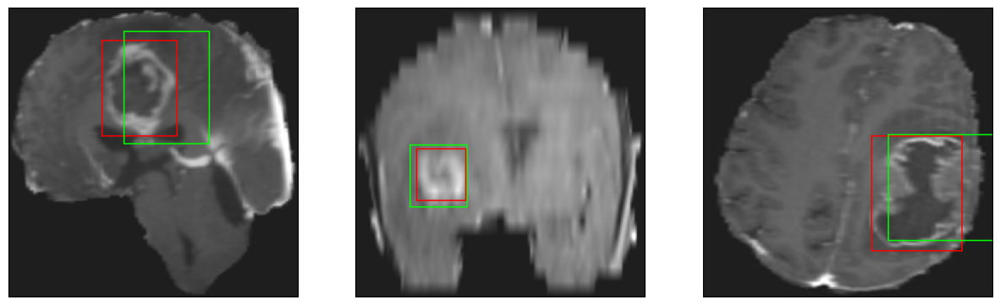

52/52 [==============================] - 33s 646ms/step - loss: 5.0860 - IoU: 0.6273 - val_loss: 6.4837 - val_IoU: 0.6391
Epoch 50/100
52/52 [==============================] - ETA: 0s - loss: 4.9120 - IoU: 0.6323
Epoch 50: val_IoU did not improve from 0.63910
8/8 [==============================] - 1s 152ms/step


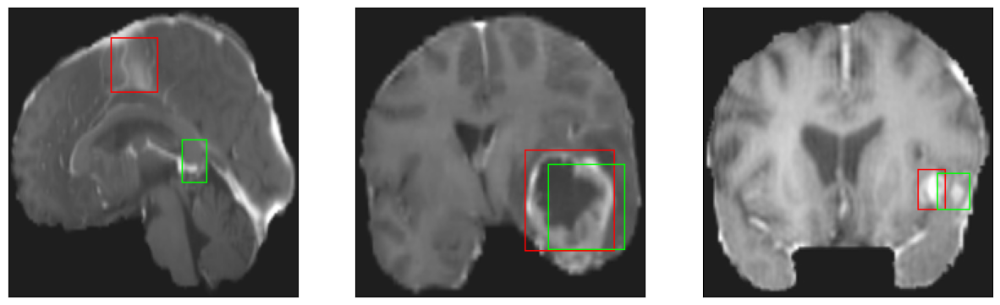

52/52 [==============================] - 21s 410ms/step - loss: 4.9120 - IoU: 0.6323 - val_loss: 7.3093 - val_IoU: 0.5952
Epoch 51/100
52/52 [==============================] - ETA: 0s - loss: 4.8481 - IoU: 0.6396
Epoch 51: val_IoU did not improve from 0.63910
8/8 [==============================] - 1s 152ms/step


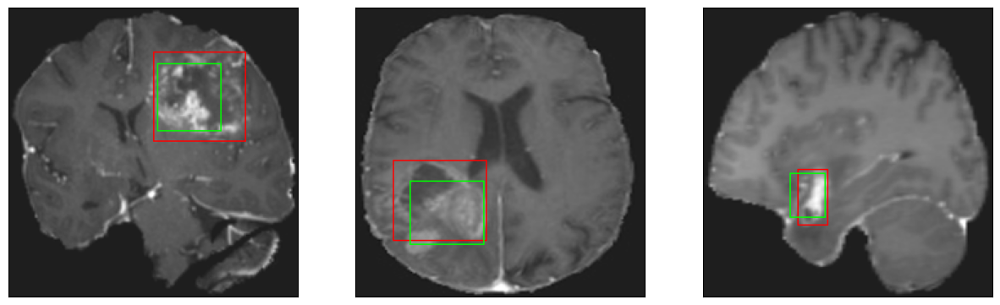

52/52 [==============================] - 21s 396ms/step - loss: 4.8481 - IoU: 0.6396 - val_loss: 7.5810 - val_IoU: 0.5730
Epoch 52/100
52/52 [==============================] - ETA: 0s - loss: 4.8509 - IoU: 0.6440
Epoch 52: val_IoU did not improve from 0.63910
8/8 [==============================] - 1s 149ms/step


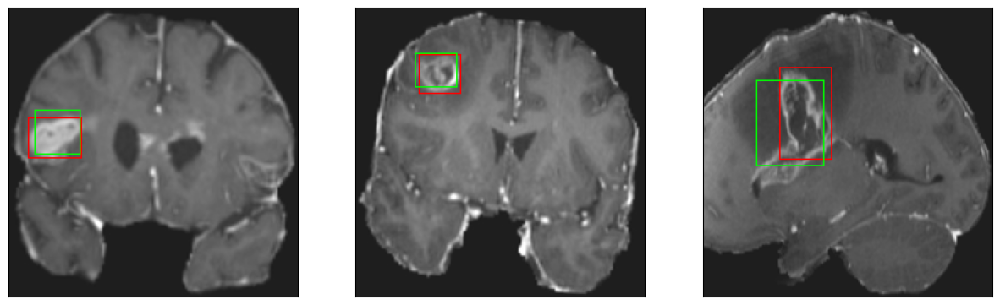

52/52 [==============================] - 20s 388ms/step - loss: 4.8509 - IoU: 0.6440 - val_loss: 6.5473 - val_IoU: 0.6305
Epoch 53/100
52/52 [==============================] - ETA: 0s - loss: 5.1243 - IoU: 0.6286
Epoch 53: val_IoU improved from 0.63910 to 0.64933, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


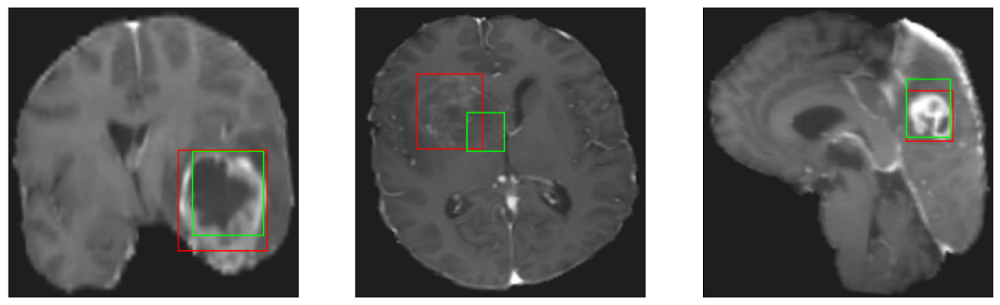

52/52 [==============================] - 31s 599ms/step - loss: 5.1243 - IoU: 0.6286 - val_loss: 6.2391 - val_IoU: 0.6493
Epoch 54/100
52/52 [==============================] - ETA: 0s - loss: 5.0906 - IoU: 0.6285
Epoch 54: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 153ms/step


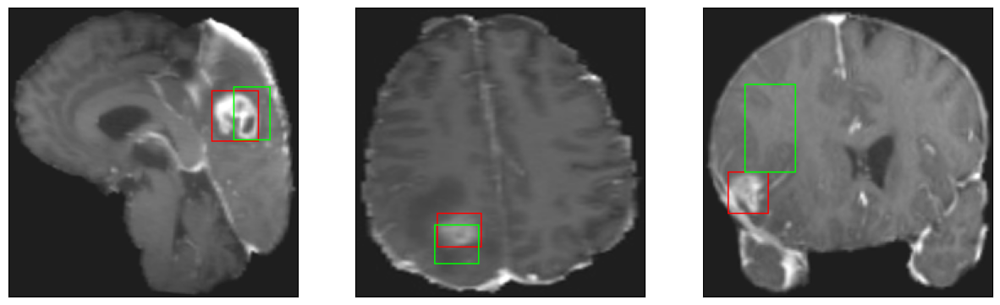

52/52 [==============================] - 20s 394ms/step - loss: 5.0906 - IoU: 0.6285 - val_loss: 9.4083 - val_IoU: 0.4910
Epoch 55/100
52/52 [==============================] - ETA: 0s - loss: 5.0297 - IoU: 0.6307
Epoch 55: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 154ms/step


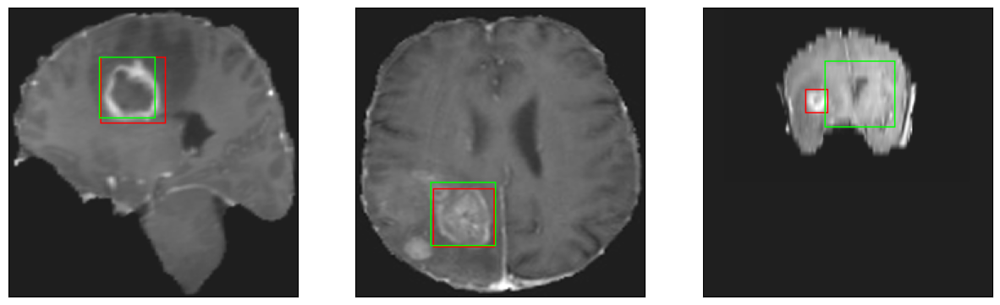

52/52 [==============================] - 20s 394ms/step - loss: 5.0297 - IoU: 0.6307 - val_loss: 21.7848 - val_IoU: 0.3810
Epoch 56/100
52/52 [==============================] - ETA: 0s - loss: 4.8434 - IoU: 0.6465
Epoch 56: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 148ms/step


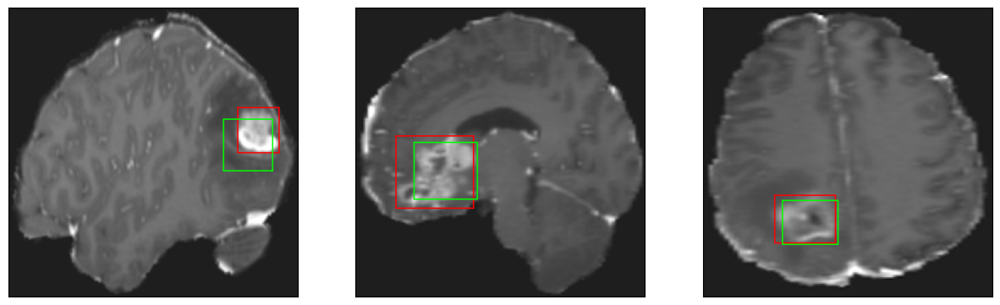

52/52 [==============================] - 21s 396ms/step - loss: 4.8434 - IoU: 0.6465 - val_loss: 7.9798 - val_IoU: 0.5081
Epoch 57/100
52/52 [==============================] - ETA: 0s - loss: 5.0177 - IoU: 0.6327
Epoch 57: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 150ms/step


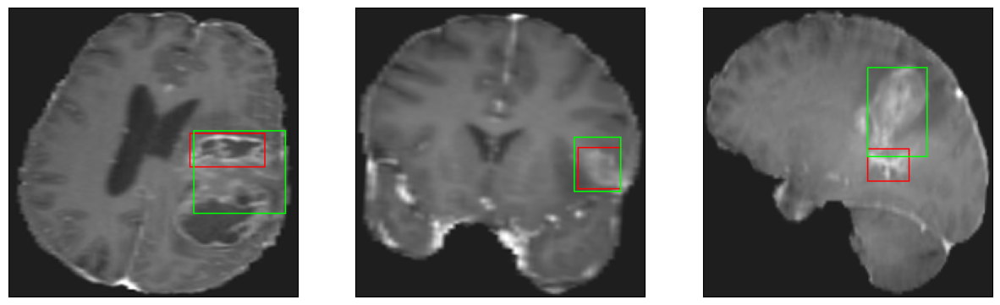

52/52 [==============================] - 20s 389ms/step - loss: 5.0177 - IoU: 0.6327 - val_loss: 6.8893 - val_IoU: 0.6027
Epoch 58/100
52/52 [==============================] - ETA: 0s - loss: 4.9231 - IoU: 0.6303
Epoch 58: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 149ms/step


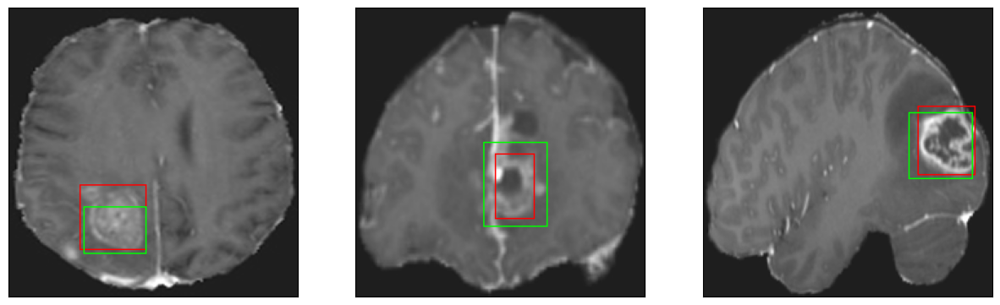

52/52 [==============================] - 20s 392ms/step - loss: 4.9231 - IoU: 0.6303 - val_loss: 7.8300 - val_IoU: 0.5797
Epoch 59/100
52/52 [==============================] - ETA: 0s - loss: 4.8836 - IoU: 0.6338
Epoch 59: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 149ms/step


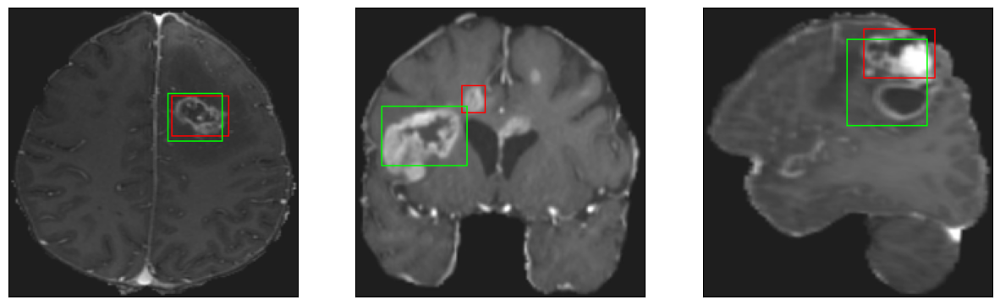

52/52 [==============================] - 20s 393ms/step - loss: 4.8836 - IoU: 0.6338 - val_loss: 6.9295 - val_IoU: 0.6064
Epoch 60/100
52/52 [==============================] - ETA: 0s - loss: 4.6048 - IoU: 0.6545
Epoch 60: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 150ms/step


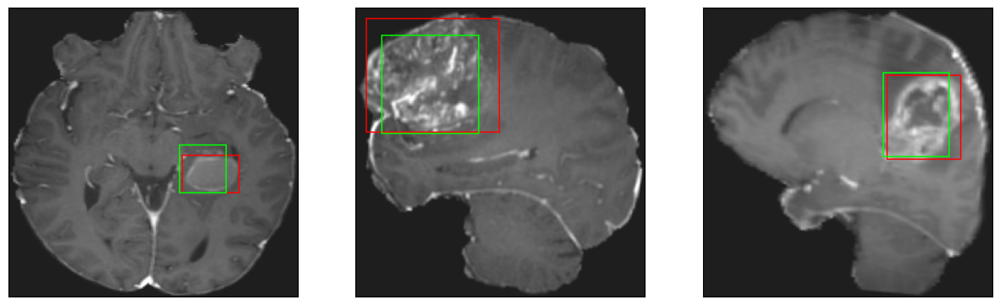

52/52 [==============================] - 20s 388ms/step - loss: 4.6048 - IoU: 0.6545 - val_loss: 6.9924 - val_IoU: 0.6084
Epoch 61/100
52/52 [==============================] - ETA: 0s - loss: 4.6591 - IoU: 0.6511
Epoch 61: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 149ms/step


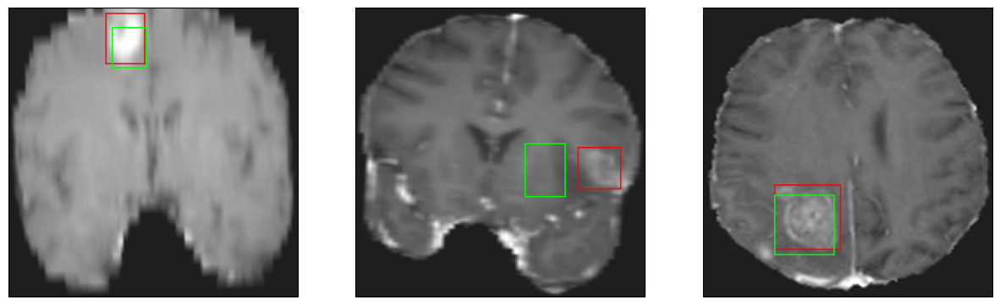

52/52 [==============================] - 20s 394ms/step - loss: 4.6591 - IoU: 0.6511 - val_loss: 6.2927 - val_IoU: 0.6471
Epoch 62/100
52/52 [==============================] - ETA: 0s - loss: 4.6561 - IoU: 0.6564
Epoch 62: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 150ms/step


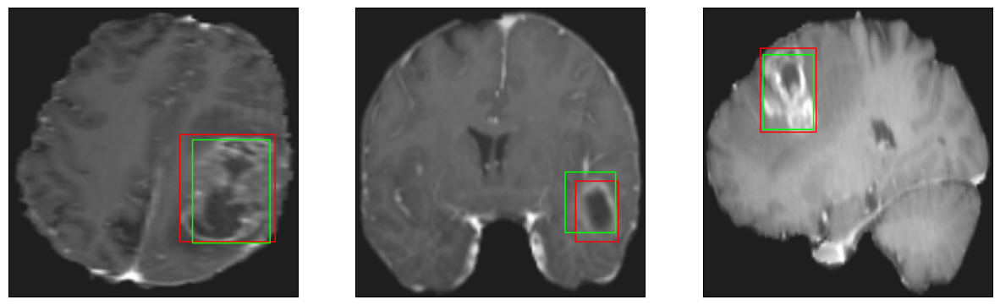

52/52 [==============================] - 20s 391ms/step - loss: 4.6561 - IoU: 0.6564 - val_loss: 6.4438 - val_IoU: 0.6287
Epoch 63/100
52/52 [==============================] - ETA: 0s - loss: 4.8776 - IoU: 0.6336
Epoch 63: val_IoU did not improve from 0.64933
8/8 [==============================] - 1s 148ms/step


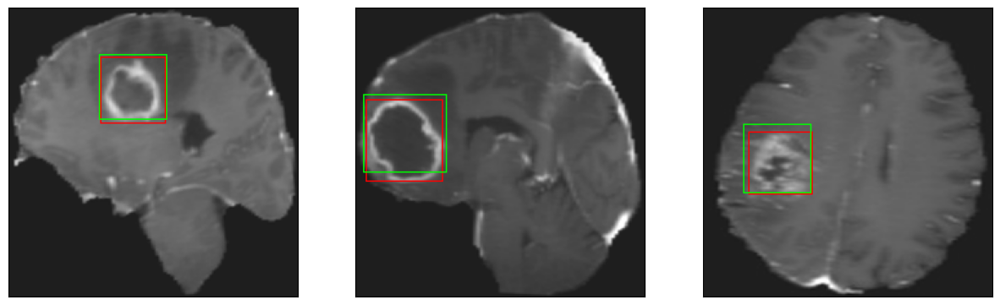

52/52 [==============================] - 20s 396ms/step - loss: 4.8776 - IoU: 0.6336 - val_loss: 6.9925 - val_IoU: 0.6183
Epoch 64/100
52/52 [==============================] - ETA: 0s - loss: 4.6047 - IoU: 0.6523
Epoch 64: val_IoU improved from 0.64933 to 0.65480, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 153ms/step


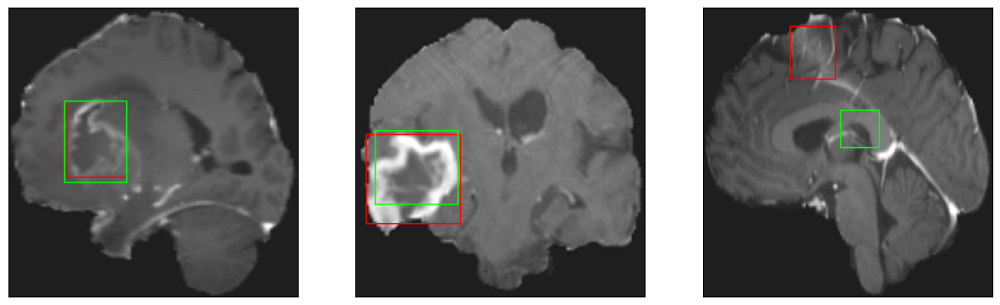

52/52 [==============================] - 34s 665ms/step - loss: 4.6047 - IoU: 0.6523 - val_loss: 6.0394 - val_IoU: 0.6548
Epoch 65/100
52/52 [==============================] - ETA: 0s - loss: 4.6696 - IoU: 0.6440
Epoch 65: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 157ms/step


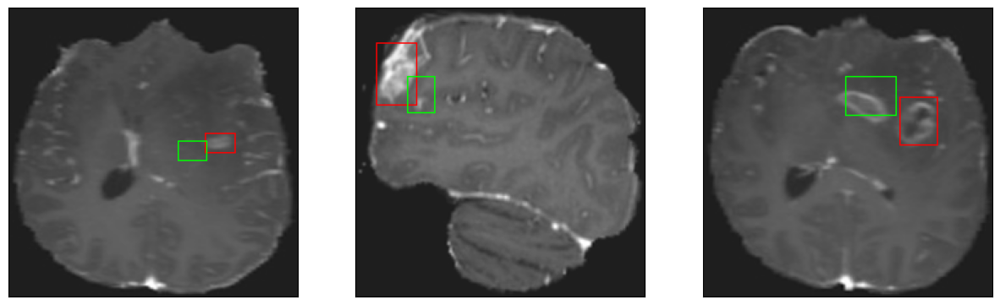

52/52 [==============================] - 21s 403ms/step - loss: 4.6696 - IoU: 0.6440 - val_loss: 7.8994 - val_IoU: 0.5850
Epoch 66/100
52/52 [==============================] - ETA: 0s - loss: 4.8048 - IoU: 0.6429
Epoch 66: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 154ms/step


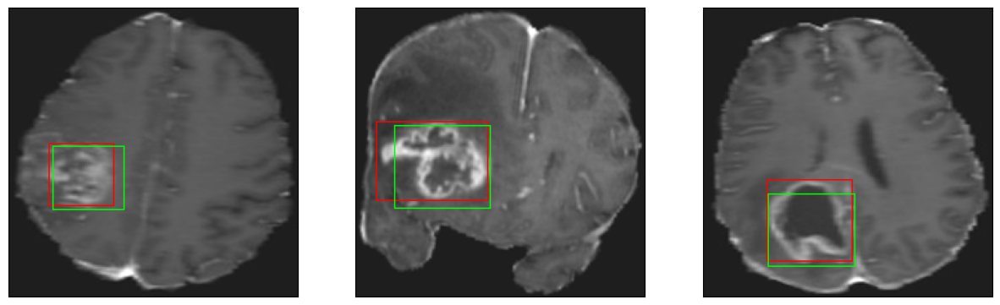

52/52 [==============================] - 21s 397ms/step - loss: 4.8048 - IoU: 0.6429 - val_loss: 7.5569 - val_IoU: 0.5546
Epoch 67/100
52/52 [==============================] - ETA: 0s - loss: 4.5376 - IoU: 0.6533
Epoch 67: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 152ms/step


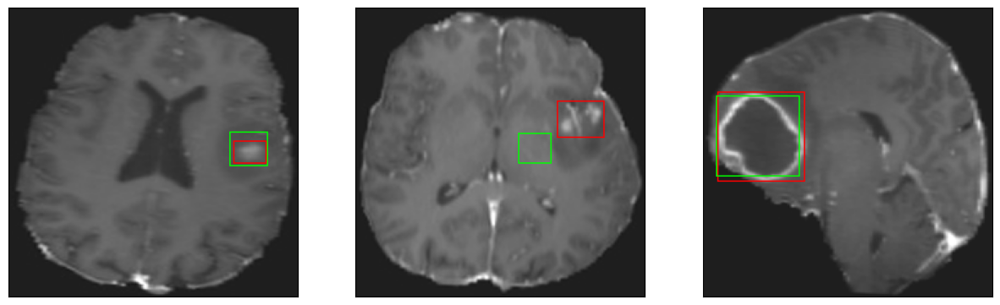

52/52 [==============================] - 21s 404ms/step - loss: 4.5376 - IoU: 0.6533 - val_loss: 6.8238 - val_IoU: 0.5881
Epoch 68/100
52/52 [==============================] - ETA: 0s - loss: 4.5304 - IoU: 0.6615
Epoch 68: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 150ms/step


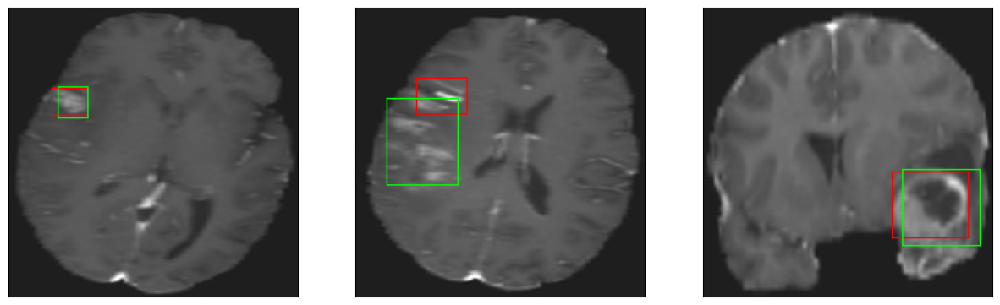

52/52 [==============================] - 20s 392ms/step - loss: 4.5304 - IoU: 0.6615 - val_loss: 7.1697 - val_IoU: 0.6180
Epoch 69/100
52/52 [==============================] - ETA: 0s - loss: 4.4859 - IoU: 0.6577
Epoch 69: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 149ms/step


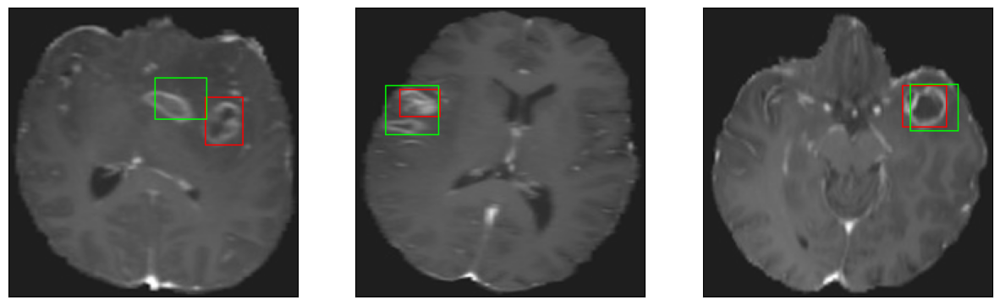

52/52 [==============================] - 21s 403ms/step - loss: 4.4859 - IoU: 0.6577 - val_loss: 6.2406 - val_IoU: 0.6416
Epoch 70/100
52/52 [==============================] - ETA: 0s - loss: 4.5667 - IoU: 0.6564
Epoch 70: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 150ms/step


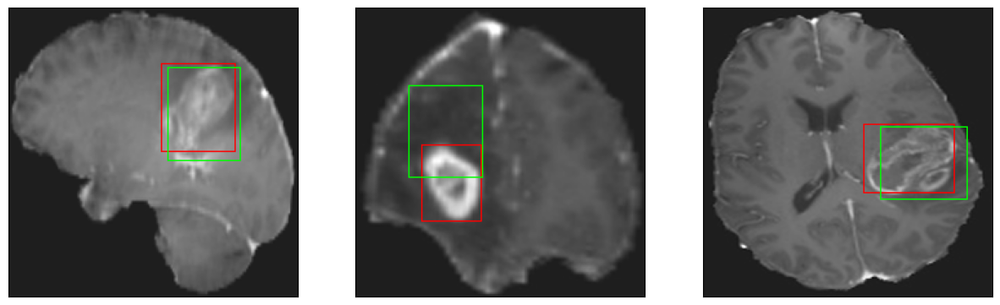

52/52 [==============================] - 20s 394ms/step - loss: 4.5667 - IoU: 0.6564 - val_loss: 7.1853 - val_IoU: 0.5964
Epoch 71/100
52/52 [==============================] - ETA: 0s - loss: 4.8444 - IoU: 0.6318
Epoch 71: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 151ms/step


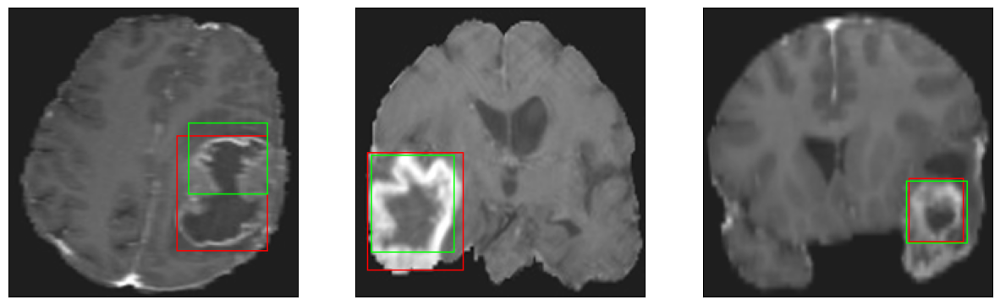

52/52 [==============================] - 21s 399ms/step - loss: 4.8444 - IoU: 0.6318 - val_loss: 7.0529 - val_IoU: 0.6412
Epoch 72/100
52/52 [==============================] - ETA: 0s - loss: 4.6072 - IoU: 0.6559
Epoch 72: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 150ms/step


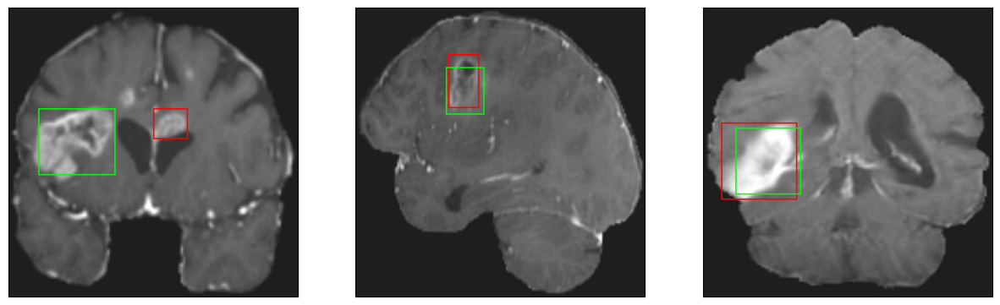

52/52 [==============================] - 21s 400ms/step - loss: 4.6072 - IoU: 0.6559 - val_loss: 6.2228 - val_IoU: 0.6250
Epoch 73/100
52/52 [==============================] - ETA: 0s - loss: 4.6264 - IoU: 0.6477
Epoch 73: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 152ms/step


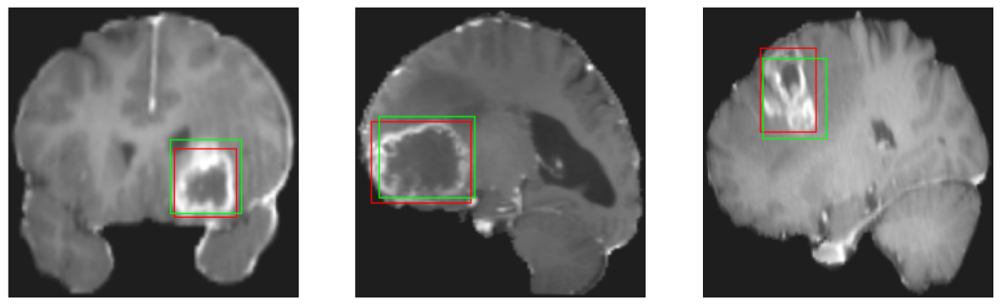

52/52 [==============================] - 21s 396ms/step - loss: 4.6264 - IoU: 0.6477 - val_loss: 8.0809 - val_IoU: 0.5964
Epoch 74/100
52/52 [==============================] - ETA: 0s - loss: 4.6586 - IoU: 0.6425
Epoch 74: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 158ms/step


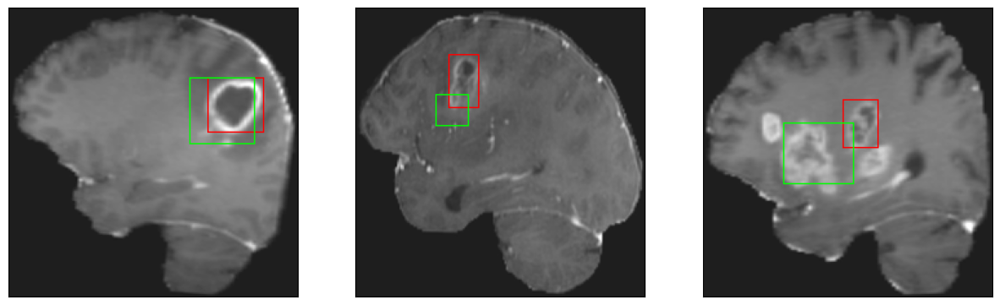

52/52 [==============================] - 21s 398ms/step - loss: 4.6586 - IoU: 0.6425 - val_loss: 8.0409 - val_IoU: 0.5565
Epoch 75/100
52/52 [==============================] - ETA: 0s - loss: 4.5266 - IoU: 0.6526
Epoch 75: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 151ms/step


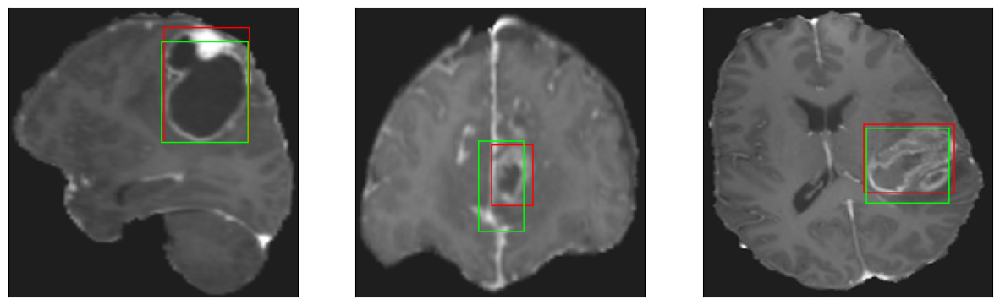

52/52 [==============================] - 21s 397ms/step - loss: 4.5266 - IoU: 0.6526 - val_loss: 6.3182 - val_IoU: 0.6518
Epoch 76/100
52/52 [==============================] - ETA: 0s - loss: 4.5844 - IoU: 0.6544
Epoch 76: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 148ms/step


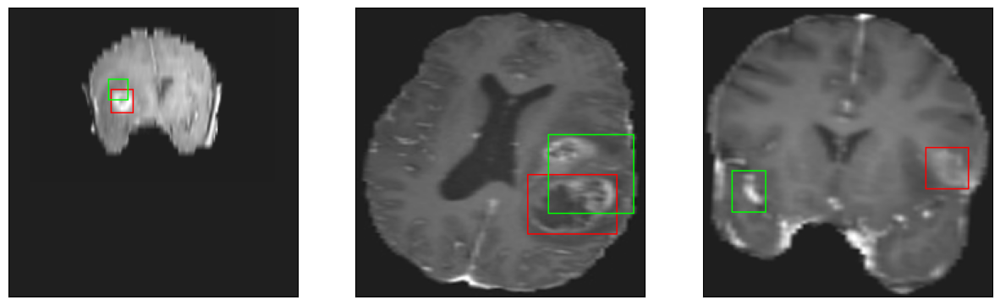

52/52 [==============================] - 20s 386ms/step - loss: 4.5844 - IoU: 0.6544 - val_loss: 6.8551 - val_IoU: 0.6278
Epoch 77/100
52/52 [==============================] - ETA: 0s - loss: 4.4652 - IoU: 0.6623
Epoch 77: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 150ms/step


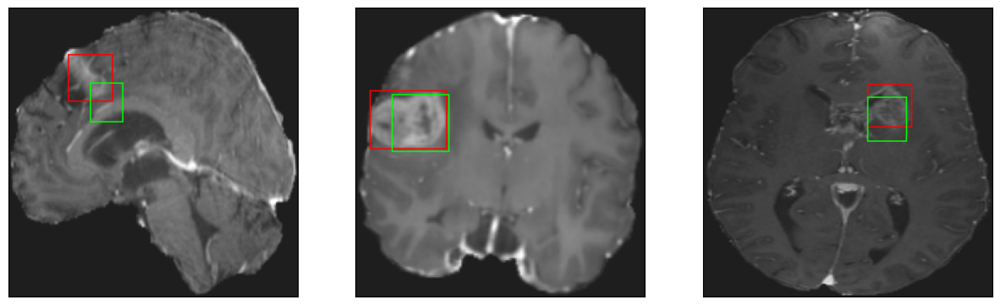

52/52 [==============================] - 21s 400ms/step - loss: 4.4652 - IoU: 0.6623 - val_loss: 6.9682 - val_IoU: 0.5997
Epoch 78/100
52/52 [==============================] - ETA: 0s - loss: 4.3682 - IoU: 0.6677
Epoch 78: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 151ms/step


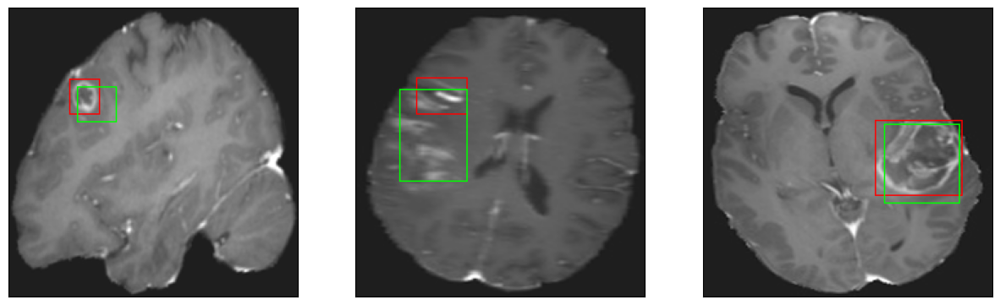

52/52 [==============================] - 20s 395ms/step - loss: 4.3682 - IoU: 0.6677 - val_loss: 6.9329 - val_IoU: 0.5777
Epoch 79/100
52/52 [==============================] - ETA: 0s - loss: 4.6858 - IoU: 0.6477
Epoch 79: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 149ms/step


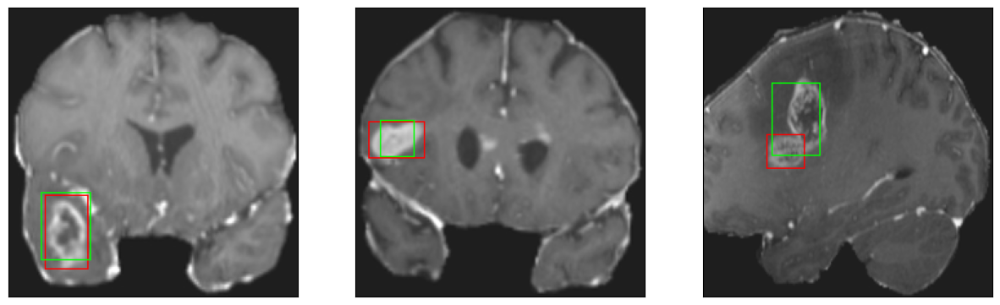

52/52 [==============================] - 21s 399ms/step - loss: 4.6858 - IoU: 0.6477 - val_loss: 6.9329 - val_IoU: 0.6168
Epoch 80/100
52/52 [==============================] - ETA: 0s - loss: 4.5373 - IoU: 0.6590
Epoch 80: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 150ms/step


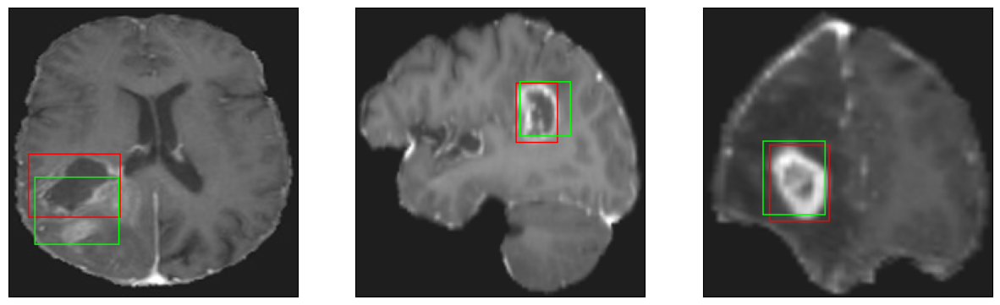

52/52 [==============================] - 20s 392ms/step - loss: 4.5373 - IoU: 0.6590 - val_loss: 7.1791 - val_IoU: 0.6198
Epoch 81/100
52/52 [==============================] - ETA: 0s - loss: 4.6618 - IoU: 0.6443
Epoch 81: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 154ms/step


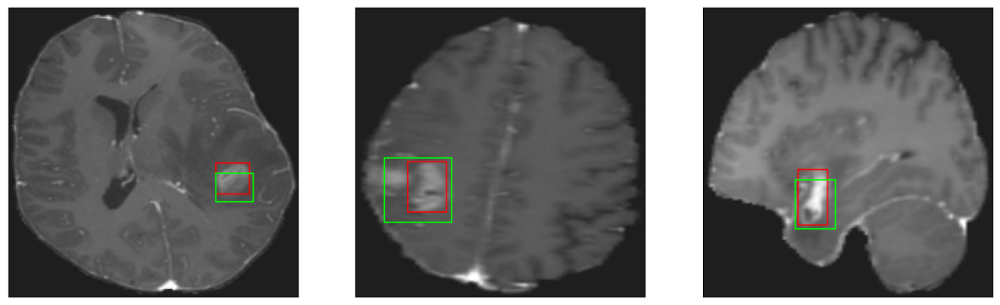

52/52 [==============================] - 22s 417ms/step - loss: 4.6618 - IoU: 0.6443 - val_loss: 7.4604 - val_IoU: 0.5918
Epoch 82/100
52/52 [==============================] - ETA: 0s - loss: 4.4410 - IoU: 0.6612
Epoch 82: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 149ms/step


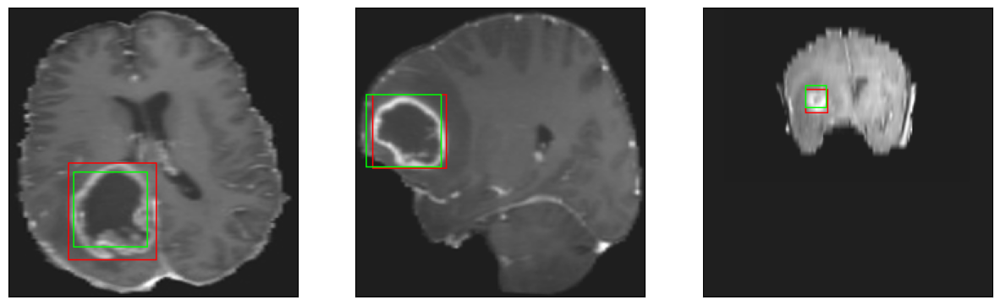

52/52 [==============================] - 20s 387ms/step - loss: 4.4410 - IoU: 0.6612 - val_loss: 7.3776 - val_IoU: 0.6050
Epoch 83/100
52/52 [==============================] - ETA: 0s - loss: 4.3978 - IoU: 0.6640
Epoch 83: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 150ms/step


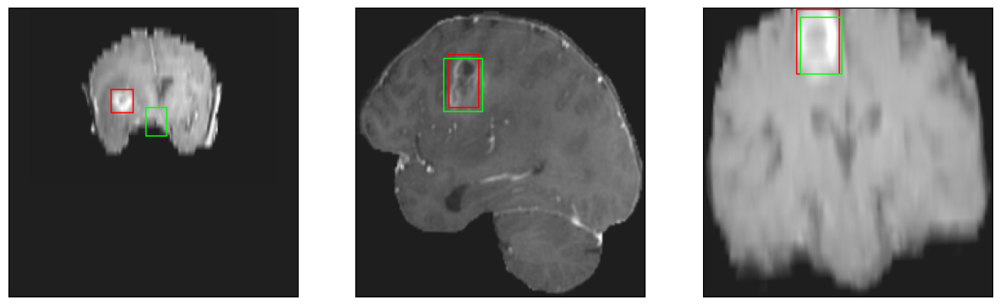

52/52 [==============================] - 20s 390ms/step - loss: 4.3978 - IoU: 0.6640 - val_loss: 7.1632 - val_IoU: 0.6148
Epoch 84/100
52/52 [==============================] - ETA: 0s - loss: 4.3058 - IoU: 0.6696
Epoch 84: val_IoU did not improve from 0.65480
8/8 [==============================] - 1s 151ms/step


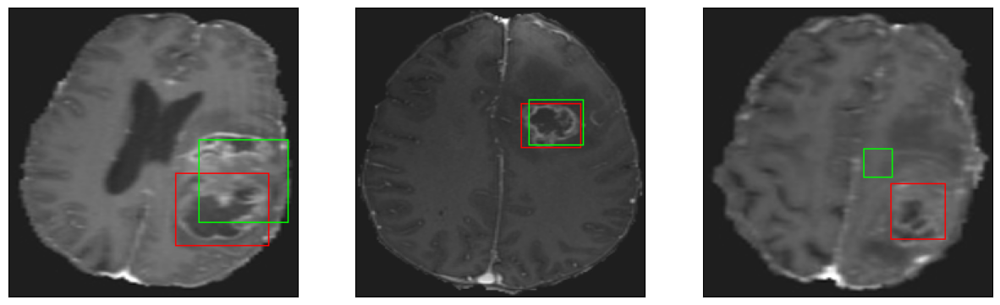

52/52 [==============================] - 20s 394ms/step - loss: 4.3058 - IoU: 0.6696 - val_loss: 7.0122 - val_IoU: 0.6002


In [30]:
#Model fitting
hist = model.fit(
        train_dataset,
        epochs=100,
        validation_data = val_dataset,
        callbacks = callbacks_list
        )

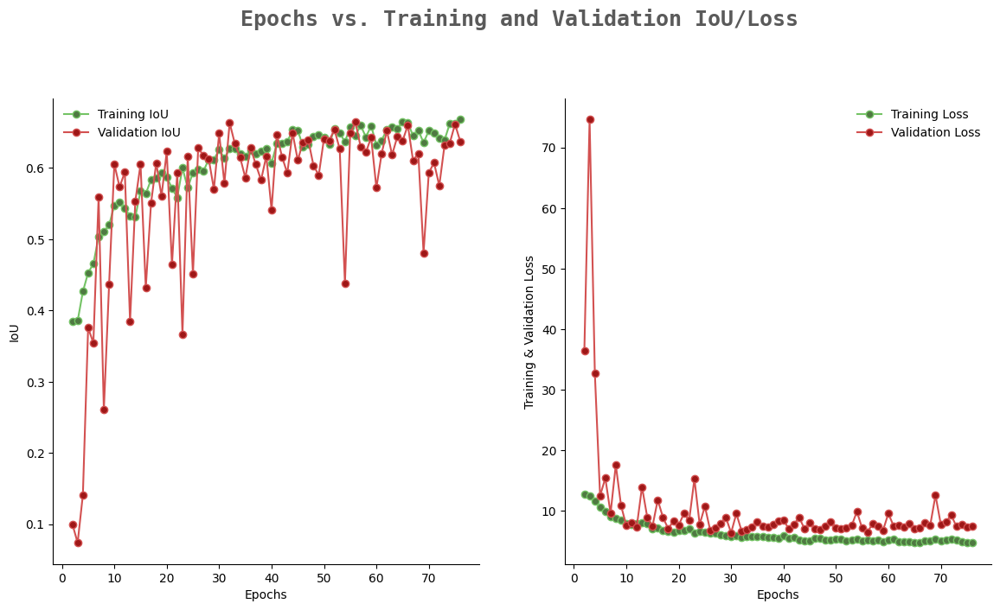

In [ ]:
#Model fitting
from warnings import filterwarnings
import seaborn as sns

filterwarnings('ignore')
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0'] 
epochs = [i for i in range(2,77)]
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = hist.history['IoU']
train_loss = hist.history['loss']
val_acc = hist.history['val_IoU']
val_loss = hist.history['val_loss']

fig.text(s='Epochs vs. Training and Validation IoU/Loss',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=1,x=0.28,alpha=0.8)

sns.despine()
ax[0].plot(epochs, train_acc[2:77], marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label = 'Training IoU')
ax[0].plot(epochs, val_acc[2:77], marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation IoU')
ax[0].legend(frameon=False)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('IoU')

sns.despine()
ax[1].plot(epochs, train_loss[2:77], marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label ='Training Loss')
ax[1].plot(epochs, val_loss[2:77], marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation Loss')
ax[1].legend(frameon=False)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Training & Validation Loss')

fig.show()

In [ ]:
#Load the model with better results
model = tf.keras.models.load_model('./model_checkpoint_RESNET/model_RESNET.h5', compile=False)

In [ ]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

In [ ]:
#Model evaluation in Loss and IoU for the test_dataset
model.evaluate(test_dataset)

15/15 [==============================] - 1s 91ms/step - loss: 8.4935 - IoU: 0.5867


[8.49350643157959, 0.5866671800613403]

In [ ]:
#Model evaluation in Loss and IoU for the val_dataset
model.evaluate(val_dataset)

6/6 [==============================] - 1s 90ms/step - loss: 6.4334 - IoU: 0.6747


[6.43344783782959, 0.6746821403503418]

In [ ]:
#Model evaluation in Loss and IoU for the train_dataset
model.evaluate(train_dataset)

52/52 [==============================] - 5s 95ms/step - loss: 3.9250 - IoU: 0.7353


[3.925034999847412, 0.7353330850601196]